## Problem 0
The file mutualFunds.csv contains a list of mutual fund symbols and their respective classes.  Extract the data for September 1, 2012 – September 1, 2017.  The python package https://pypi.python.org/pypi/fix-yahoo-finance/0.0.19 may be useful for this purpose, but any method is fair game.  We found that the Google equivalent works great for stocks but doesn't work for mutual funds.  We also found that Yahoo messed up its service in May 2017 so half the packages out there no longer work.  

Since these are mutual funds, there are no intra-day prices so you can use the closing prices.  Note that Yahoo's service is not perfect in that it may return $0.00 or null or NA values for some days.  In such cases, interpolate the results by using the average of the surrounding values as you see fit.

For this problem, you may need the following:
pip install pandas-datareader
pip install yahoo-finance
pip install fix_yahoo_finance --upgrade --no-cache-dir


Print out the first two weeks of OAKMX

In [276]:
# cell block to import needed libraries
%matplotlib inline 

import matplotlib.cm as cm
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import Image

from io import StringIO
import requests
import json

from io import BytesIO  
import requests  
import json  

import datetime
from scipy import stats
import scipy.cluster.hierarchy as hac
import matplotlib.dates as mdates
import matplotlib.ticker as ticker

from yahoo_finance import Share
from pandas_datareader import data as pdr
import fix_yahoo_finance as yf


from scipy.cluster.hierarchy import fcluster

import datetime
import seaborn as sns;
from scipy import stats
import scipy.cluster.hierarchy as hac

import warnings

import sklearn
from sklearn.utils import shuffle
from sklearn.cluster import KMeans
from sklearn import datasets

import seaborn
import statsmodels.api as sm
import statsmodels.tsa.api as smt
import statsmodels.graphics.api as smg
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.stattools import adfuller, periodogram
from statsmodels.graphics.gofplots import qqplot

from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose

from matplotlib.colors import ListedColormap

from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples

In [277]:
dark2_colors = [(0.10588235294117647, 0.6196078431372549, 0.4666666666666667),
                (0.9058823529411765, 0.1607843137254902, 0.5411764705882353),
                (0.8509803921568627, 0.37254901960784315, 0.00784313725490196),
                (0.4588235294117647, 0.4392156862745098, 0.7019607843137254),            
                (0.4, 0.6509803921568628, 0.11764705882352941),
                (0.9019607843137255, 0.6705882352941176, 0.00784313725490196),
                (0.6509803921568628, 0.4627450980392157, 0.11372549019607843)]

cmap_set1 = ListedColormap(['#e41a1c', '#377eb8', '#4daf4a'])
dark2_cmap=ListedColormap(dark2_colors)

In [11]:
# code for running in DSX notebook on cloud
# !pip install pandas-datareader

In [12]:
# code for running in DSX notebook on cloud
#!pip install yahoo-finance

In [13]:
## code for running in DSX notebook on cloud
#!pip install fix_yahoo_finance --upgrade --no-cache-dir

Requirement already up-to-date: fix_yahoo_finance in /gpfs/global_fs01/sym_shared/YPProdSpark/user/sfdb-2095b6be7f15a4-029a8c7f11e3/.local/lib/python3.5/site-packages
Requirement already up-to-date: pandas in /gpfs/global_fs01/sym_shared/YPProdSpark/user/sfdb-2095b6be7f15a4-029a8c7f11e3/.local/lib/python3.5/site-packages (from fix_yahoo_finance)
Requirement already up-to-date: numpy in /gpfs/global_fs01/sym_shared/YPProdSpark/user/sfdb-2095b6be7f15a4-029a8c7f11e3/.local/lib/python3.5/site-packages (from fix_yahoo_finance)
Requirement already up-to-date: requests in /gpfs/global_fs01/sym_shared/YPProdSpark/user/sfdb-2095b6be7f15a4-029a8c7f11e3/.local/lib/python3.5/site-packages (from fix_yahoo_finance)
Requirement already up-to-date: multitasking in /gpfs/global_fs01/sym_shared/YPProdSpark/user/sfdb-2095b6be7f15a4-029a8c7f11e3/.local/lib/python3.5/site-packages (from fix_yahoo_finance)
Requirement already up-to-date: python-dateutil>=2 in /gpfs/global_fs01/sym_shared/YPProdSpark/user/sf

In [285]:
# code for running in DSX notebook on cloud
# @hidden_cell
# This function accesses a file in your Object Storage. The definition contains your credentials.
# You might want to remove those credentials before you share your notebook.
def get_object_storage_file_with_credentials_b80cde39751d45f8b20c1a75f94363a1(container, filename):
    """This functions returns a StringIO object containing
    the file content from Bluemix Object Storage."""

    url1 = ''.join(['https://identity.open.softlayer.com', '/v3/auth/tokens'])
    data = {'auth': {'identity': {'methods': ['password'],
            'password': {'user': {'name': 'member_xxxxxxxxxx','domain': {'id': 'xxxxxxxxxx'},
            'password': 'xxxxxxxxxx'}}}}}
    headers1 = {'Content-Type': 'application/json'}
    resp1 = requests.post(url=url1, data=json.dumps(data), headers=headers1)
    resp1_body = resp1.json()
    for e1 in resp1_body['token']['catalog']:
        if(e1['type']=='object-store'):
            for e2 in e1['endpoints']:
                        if(e2['interface']=='public'and e2['region']=='dallas'):
                            url2 = ''.join([e2['url'],'/', container, '/', filename])
    s_subject_token = resp1.headers['x-subject-token']
    headers2 = {'X-Auth-Token': s_subject_token, 'accept': 'application/json'}
    resp2 = requests.get(url=url2, headers=headers2)
    return StringIO(resp2.text)




In [286]:
# code for running in DSX notebook on cloud
# @hidden_cell
credentials_1 = {
  'auth_url':'https://identity.open.softlayer.com',
  'project':'object_storage_b80cde39_751d_45f8_b20c_1a75f94363a1',
  'project_id':'0c957df16e7b4eae896798a6e62ec1e8',
  'region':'dallas',
  'user_id':'xxxxxxxxxx',
  'domain_id':'xxxxxxxxxx',
  'domain_name':'xxxxxxxxxx',
  'username':'member_xxxxxxxxxx',
  'password':"""xxxxxxxxxx""",
  'container':'E82project',
  'tenantId':'undefined',
  'filename':'timeSeries1.csv'
}


In [287]:
# code for running in DSX notebook on cloud
# @hidden_cell

def put_file(credentials, local_file_name):  
    """This functions returns a StringIO object containing
    the file content from Bluemix Object Storage V3."""
    f = open(local_file_name,'r')
    my_data = f.read()
    url1 = ''.join(['https://identity.open.softlayer.com', '/v3/auth/tokens'])
    data = {'auth': {'identity': {'methods': ['password'],
            'password': {'user': {'name': credentials['username'],'domain': {'id': credentials['domain_id']},
            'password': credentials['password']}}}}}
    headers1 = {'Content-Type': 'application/json'}
    resp1 = requests.post(url=url1, data=json.dumps(data), headers=headers1)
    resp1_body = resp1.json()
    for e1 in resp1_body['token']['catalog']:
        if(e1['type']=='object-store'):
            for e2 in e1['endpoints']:
                        if(e2['interface']=='public'and e2['region']=='dallas'):
                            url2 = ''.join([e2['url'],'/', credentials['container'], '/', local_file_name])
    s_subject_token = resp1.headers['x-subject-token']
    headers2 = {'X-Auth-Token': s_subject_token, 'accept': 'application/json'}
    resp2 = requests.put(url=url2, headers=headers2, data = my_data )
    print(resp2)

In [278]:
# code for running in DSX notebook on cloud
df_timeSeries1 = pd.read_csv(get_object_storage_file_with_credentials_b80cde39751d45f8b20c1a75f94363a1('E82project', 'timeSeries1.csv'))
df_timeSeries1.head()

,Unnamed: 0,x
0,1,-1.033257
1,2,-0.498029
2,3,1.036952
3,4,2.451795
4,5,7.359030


In [279]:
# code for running in DSX notebook on cloud
df_timeSeries2 = pd.read_csv(get_object_storage_file_with_credentials_b80cde39751d45f8b20c1a75f94363a1('E82project', 'timeSeries2.csv'))
df_timeSeries2.head()

,Unnamed: 0,x
0,1,38.639252
1,2,36.040797
2,3,36.894748
3,4,36.832112
4,5,34.793297


In [280]:
# code for running in DSX notebook on cloud
df_mutualFunds = pd.read_csv(get_object_storage_file_with_credentials_b80cde39751d45f8b20c1a75f94363a1('E82project', 'mutualFunds.csv'))
df_mutualFunds.head()

,AABTX,Hybrid
0,AACTX,Hybrid
1,AADTX,Hybrid
2,AAETX,Hybrid
3,AAFTX,Hybrid
4,AAGPX,LargeVal


In [5]:
# code for running in local

df_timeSeries1 = pd.read_csv('timeSeries1.csv')
df_timeSeries2 = pd.read_csv('timeSeries2.csv')
df_mutualFunds = pd.read_csv('mutualFunds.csv')

In [14]:
df_mutualFunds.shape

(637, 2)

In [15]:
mf_share = Share('OAKMX')
print(mf_share.get_price())

82.58


In [14]:

yf.pdr_override() 

# download dataframe
yf_data = pdr.get_data_yahoo("OAKMX", start="2012-09-01", end="2017-09-01")

/gpfs/fs01/user/sfdb-2095b6be7f15a4-029a8c7f11e3/.local/lib/python3.5/site-packages/fix_yahoo_finance/__init__.py:43: DeprecationWarning: 
    Auto-overriding of pandas_datareader's get_data_yahoo() is deprecated and no longer available.
    Use pdr_override() to explicitly override it.
  DeprecationWarning)


[*********************100%***********************]  1 of 1 downloaded

In [15]:
yf_data.head(5)

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2012-09-04,47.939999,47.939999,47.939999,47.939999,39.558872,0
2012-09-05,47.889999,47.889999,47.889999,47.889999,39.517609,0
2012-09-06,48.950001,48.950001,48.950001,48.950001,40.392296,0
2012-09-07,49.180000,49.180000,49.180000,49.180000,40.582081,0
2012-09-10,48.790001,48.790001,48.790001,48.790001,40.260273,0


In [16]:
yf_data.index[yf_data.shape[0]-1]


Timestamp('2017-09-01 00:00:00')

### The code segment below is to list first two weeks of OAKMX records from Yahoo finance data

In [17]:

# get the first row date, assuming the data is sorted by asc date already
first_row_date = yf_data.index[0]
# get the last row date
last_row_date = yf_data.index[yf_data.shape[0]-1]
# get all the dates supposed to be in this date range
# and transform the data frame with the missing dates
idx = pd.date_range(yf_data.index[0], last_row_date)
yf_filled_data = yf_data.reindex(idx, fill_value=np.nan)

#yf_filled_data[yf_filled_data==0] = np.nan

# interpolate the missing data for those missing dates
yf_filled_data = yf_filled_data.interpolate(method='time')

# retrieve the first 14 days from the data frame
end_date = first_row_date + pd.Timedelta('14 days')
date_mask = (yf_filled_data.index >= first_row_date) & (yf_filled_data.index <= end_date)
dates = yf_filled_data.index[date_mask]
print('The first two weeks of OAKMX : \n')

print(yf_filled_data.ix[dates])

The first two weeks of OAKMX : 

                 Open       High        Low      Close  Adj Close  Volume
2012-09-04  47.939999  47.939999  47.939999  47.939999  39.558872     0.0
2012-09-05  47.889999  47.889999  47.889999  47.889999  39.517609     0.0
2012-09-06  48.950001  48.950001  48.950001  48.950001  40.392296     0.0
2012-09-07  49.180000  49.180000  49.180000  49.180000  40.582081     0.0
2012-09-08  49.050000  49.050000  49.050000  49.050000  40.474812     0.0
2012-09-09  48.920001  48.920001  48.920001  48.920001  40.367542     0.0
2012-09-10  48.790001  48.790001  48.790001  48.790001  40.260273     0.0
2012-09-11  48.959999  48.959999  48.959999  48.959999  40.400547     0.0
2012-09-12  49.130001  49.130001  49.130001  49.130001  40.540829     0.0
2012-09-13  49.919998  49.919998  49.919998  49.919998  41.192707     0.0
2012-09-14  50.310001  50.310001  50.310001  50.310001  41.514530     0.0
2012-09-15  50.230001  50.230001  50.230001  50.230001  41.448518     0.0
2012-

/usr/local/src/conda3_runtime.v17/4.1.1/lib/python3.5/site-packages/ipykernel/__main__.py:23: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


<a id='Problem-1'></a>

## Problem 1  Cluster the raw data (25 pts)

[Back to top](#top)


### Problem 1a
[Back to top](#top)

<a id='Problem-1a'></a>

One can assume that all the data start and end at the same time point so no time warping will be required to compare different schemes. However, that does not mean that you should not explore different normalization approaches that may be applicable.  Apply several clustering schemes to identify an appropriate clustering method for the data.  You will likely have to tune the clustering parameters.  We are looking for:
<ul>
<li> effort & learnings from trying different methods/approaches, particularly some not covered in previous classes
<li> logical approach to the clustering problem using insights gained and stated
<li> tuning of the algorithm to the appropriate number of clusters, parameters, etc.
</ul>


In [359]:
def yahoodata_processor(symbol):
    """Retrieve data from Yahoo Finance API for duration defined and also interpolate the missing data
    params: symbol: stock symbol
    result: data frame which includes all YF data. If there is no data being returned from YF, return None
    """
    symbol_yf_data = pdr.get_data_yahoo(s, start="2012-09-01", end="2017-09-01")
    # need to consider that some mutual fund symbol has no yahoo data returned back from API
    if (not symbol_yf_data.empty):
        # get the first row date, assuming the data is sorted by asc date already
        first_row_date = symbol_yf_data.index[0]
        # get the last row date
        last_row_date = symbol_yf_data.index[symbol_yf_data.shape[0]-1]
        # get all the dates supposed to be in this date range
        # and transform the data frame with the missing dates
        idx = pd.date_range(first_row_date, last_row_date)
        symbol_yf_filled_data = symbol_yf_data.reindex(idx, fill_value=np.nan)

        # interpolate the missing data for those missing dates
        symbol_yf_filled_data = symbol_yf_filled_data.interpolate(method='time')
        return symbol_yf_filled_data
    else:
        return None

In [ ]:
# data exploratory. build up mf_final data frame which aggregates all mutual funds' yahoo finance together
print('dimension of mutual fund data is {}'.format(df_mutualFunds.shape))
df_mutualFunds.columns = ['symbol','type']
print('columns of mutual fund are {}'.format(list(df_mutualFunds)))
print('unique types of mutual fund are {}'.format(df_mutualFunds.type.unique()))
# get the mutualfunds with their yahoo finance data
print(df_mutualFunds.symbol[1:3])
mf_final = pd.DataFrame()  # get empty data frame
for s in df_mutualFunds.symbol :
    symbol_yf_data = yahoodata_processor(s)
    symbol_yf_data['symbol'] = s  # this will make constant symbol value for all rows
    #print(symbol_yf_data.head(5))
    mf_final = mf_final.append(symbol_yf_data) # keep the date index, do not set ignore_index = True
mf_final.shape

dimension of mutual fund data is (637, 2)
columns of mutual fund are ['symbol', 'type']
unique types of mutual fund are ['Hybrid' 'LargeVal' 'International' 'LargeBlnd' 'MidVal' 'LargeGro'
 'MidBlnd' 'MidGro' 'SmallVal' 'SmallGro' 'SmallBlnd']
1    AADTX
2    AAETX
Name: symbol, dtype: object


In [ ]:
# merge mf_final with mutual fund data to get type column
#mf_merged = pd.merge(mf_final,df_mutualFunds, how='left', on =['symbol']) # this way loses index
mf_merged = mf_final.reset_index().merge(df_mutualFunds, how="left", on =['symbol']).set_index('index') # this is to keep index
#mf_merged.head(5)


## since it takes time to generate the final merged set, we need to save generated mutualfund data into object storage as a file

In [ ]:
# code for running in DSX notebook on cloud
mf_merged_noIndex = mf_merged.reset_index(inplace = False) # change date from index col to ordinary col before putting into csv
mf_merged_noIndex.head(5)
mf_merged_noIndex.to_csv('mf_yf.csv', index = False) # pass index as False to remove the unnamed index column
put_file(credentials_1,'mf_yf.csv')

###  if the kernel restarted and lose the memory data, don't need to run yahoo finance data retrieval again, run the following instead

In [281]:
# code for running in DSX notebook on cloud
# if the kernel restarted and lose the memory data, don't need to run yahoo finance data retrieval again, run the following instead
mf_from_file = pd.read_csv(get_object_storage_file_with_credentials_b80cde39751d45f8b20c1a75f94363a1('E82project', 'mf_yf.csv'), index_col = 0) # tell read_csv that the first col is index to remove unnamed col


In [6]:
# code for running locally
mf_from_file = pd.read_csv('mf_yf.csv', index_col = 0) # tell read_csv that the first col is index to remove unnamed col


In [282]:
#mf_from_file.set_index('index', inplace = True) # need to reset the index back
mf_from_file.head(5)

,Open,High,Low,Close,Adj Close,Volume,symbol,type
index,,,,,,,,
2012-09-04,9.66,9.66,9.66,9.66,8.255667,0.0,AACTX,Hybrid
2012-09-05,9.65,9.65,9.65,9.65,8.247121,0.0,AACTX,Hybrid
2012-09-06,9.77,9.77,9.77,9.77,8.349677,0.0,AACTX,Hybrid
2012-09-07,9.81,9.81,9.81,9.81,8.383862,0.0,AACTX,Hybrid
2012-09-08,9.80,9.80,9.80,9.80,8.375315,0.0,AACTX,Hybrid


In [18]:
# data exploratory in mf_merged
#mf_merged.columns.values[4] = 'AdjClose' # rename Adj Close to Adj_Close, this doesn't seem make inplace change
mf_from_file.rename(columns={'Adj Close' : 'Adj_Close'}, inplace=True)
print('dimension of mutual fund data is {}'.format(mf_from_file.shape))
print('columns of mutual fund are {}'.format(list(mf_from_file)))
print('number of unique symbols of mutual fund is {}'.format(len(mf_from_file.symbol.unique())))
print('unique types of mutual fund are {}'.format(mf_from_file.type.unique()))
print(mf_from_file.dtypes.index)

dimension of mutual fund data is (1161888, 8)
columns of mutual fund are ['Open', 'High', 'Low', 'Close', 'Adj_Close', 'Volume', 'symbol', 'type']
number of unique symbols of mutual fund is 637
unique types of mutual fund are ['Hybrid' 'LargeVal' 'International' 'LargeBlnd' 'MidVal' 'LargeGro'
 'MidBlnd' 'MidGro' 'SmallVal' 'SmallGro' 'SmallBlnd']
Index(['Open', 'High', 'Low', 'Close', 'Adj_Close', 'Volume', 'symbol',
       'type'],
      dtype='object')


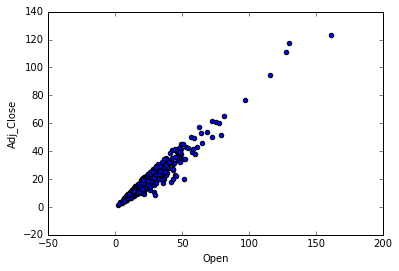

In [9]:
# draw scatter plot to observe some patterns
test_set = mf_from_file.loc['2012-09-04']

plt.scatter(test_set.Open,test_set.Adj_Close)
plt.xlabel('Open')
plt.ylabel('Adj_Close')

plt.show()

/gpfs/fs01/user/sfdb-2095b6be7f15a4-029a8c7f11e3/.local/lib/python3.5/site-packages/dateutil/rrule.py:452: DeprecationWarning: Using both 'count' and 'until' is inconsistent with RFC 2445 and has been deprecated in dateutil. Future versions will raise an error.
  "raise an error.", DeprecationWarning)


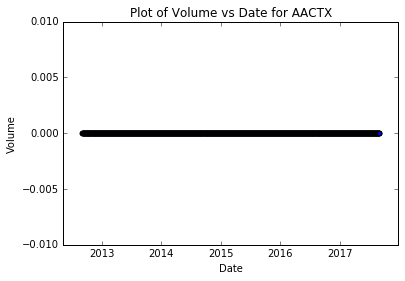

In [10]:
plt.scatter(pd.to_datetime(mf_from_file[mf_from_file.symbol=='AACTX'].index),mf_from_file[mf_from_file.symbol=='AACTX'].Volume)
plt.title('Plot of Volume vs Date for AACTX')
plt.xlabel('Date')
plt.ylabel('Volume')
plt.show()

### since Open , High, Low are highly correlated, we can pick one of them. i.e. Close. Volume also shows quite a lot zeros, we remove it from the final clustering set also.
### we also transpose the dataframe to make all timepoints as feature set indexed by symbols


In [283]:



target_set = mf_from_file[["Close","symbol","type"]]
print('for the beginning date {}, there are {} mutural funds'.format(target_set.index[0],len(target_set.loc[target_set.index[0]])))
print('for the last date {}, there are {} mutual funds'.format(target_set.index[len(target_set.index)-1],len(target_set.loc[target_set.index[len(target_set.index)-1]])))
print(target_set.head(5))

# we convert date time index to integer 
time_series = target_set.index.unique()
timepoint = pd.Series(pd.factorize(time_series)[0] + 1, index = time_series, name = 'timepoint')
#merge timepoint back into target_set
mf_series = pd.merge(target_set, timepoint.to_frame(), left_index=True, right_index=True, how='outer')

print(mf_series.head(5))
# resuffle the mf_series, to have rows as symbol and columns as time
mf_series.reset_index(inplace = True)
print(mf_series.head(5))
#remove time stamp from the dataset
mf_series.drop('index',axis = 1, inplace = True)
print(mf_series.head(5))
# shuffle row and columns around
#timeseries_set = mf_series.groupby(['symbol','timepoint'])['Close','type'].unstack()
timeseries_set = mf_series.pivot(index='symbol', columns='timepoint')['Close']
print(timeseries_set.head(5))
print(timeseries_set.values)

for the beginning date 2012-09-04, there are 637 mutural funds
for the last date 2017-09-01, there are 637 mutual funds
            Close symbol    type
index                           
2012-09-04   9.66  AACTX  Hybrid
2012-09-05   9.65  AACTX  Hybrid
2012-09-06   9.77  AACTX  Hybrid
2012-09-07   9.81  AACTX  Hybrid
2012-09-08   9.80  AACTX  Hybrid
                Close symbol      type  timepoint
index                                            
2012-09-04   9.660000  AACTX    Hybrid          1
2012-09-04   9.710000  AADTX    Hybrid          1
2012-09-04   9.920000  AAETX    Hybrid          1
2012-09-04   9.850000  AAFTX    Hybrid          1
2012-09-04  19.959999  AAGPX  LargeVal          1
        index      Close symbol      type  timepoint
0  2012-09-04   9.660000  AACTX    Hybrid          1
1  2012-09-04   9.710000  AADTX    Hybrid          1
2  2012-09-04   9.920000  AAETX    Hybrid          1
3  2012-09-04   9.850000  AAFTX    Hybrid          1
4  2012-09-04  19.959999  AAGPX  L

### draw out all symbols' time series for the defined time period

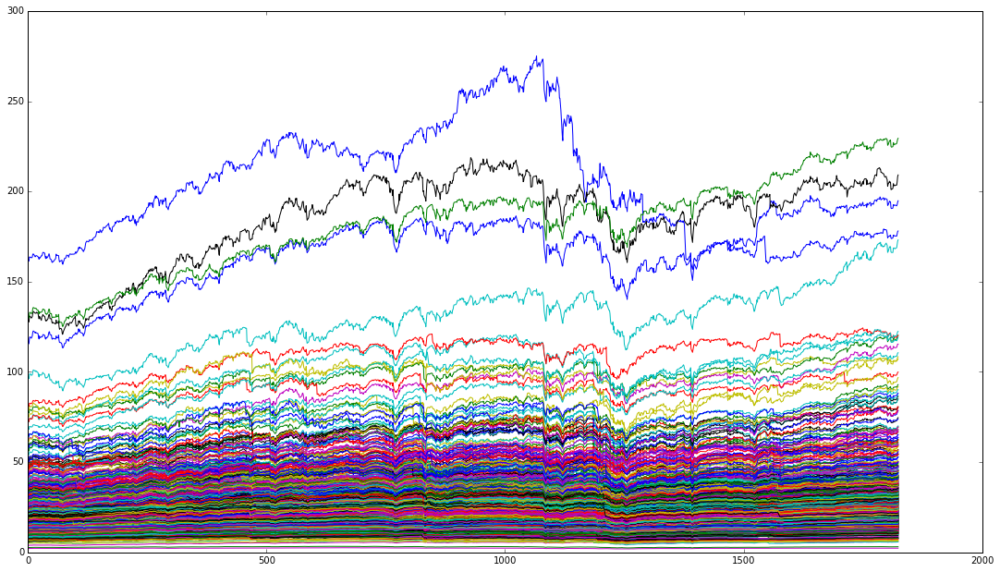

In [12]:

warnings.filterwarnings("ignore")
# plot timeseries_set
#test_set = timeseries_set.loc[timeseries_set.index.isin(['AACTX','AAETX','AAFTX','AAGPX'])]
#print(test_set.head(5))
#print(timeseries_set.T.head(5))
unique_symbols = mf_from_file.symbol.unique()
fig, ax = plt.subplots()
fig.set_size_inches(18.5, 10.5)
_ = ax.plot(timeseries_set.T.index,timeseries_set.T[unique_symbols])  #IPython only shows you the plots and the name _ is bound to the unwanted output.
#ax.set(ylim=(9, 10))
#ax.set(xlim=('2012-09-04', '2012-12-04'))
# put the labels at 45deg since they tend to be too long
#fig.autofmt_xdate()

In [ ]:
# The following script is to update seaborn version for Ipython Notebook on cloud
#!pip install --upgrade seaborn

### use seaborn tsplot to draw out the same time series plot 

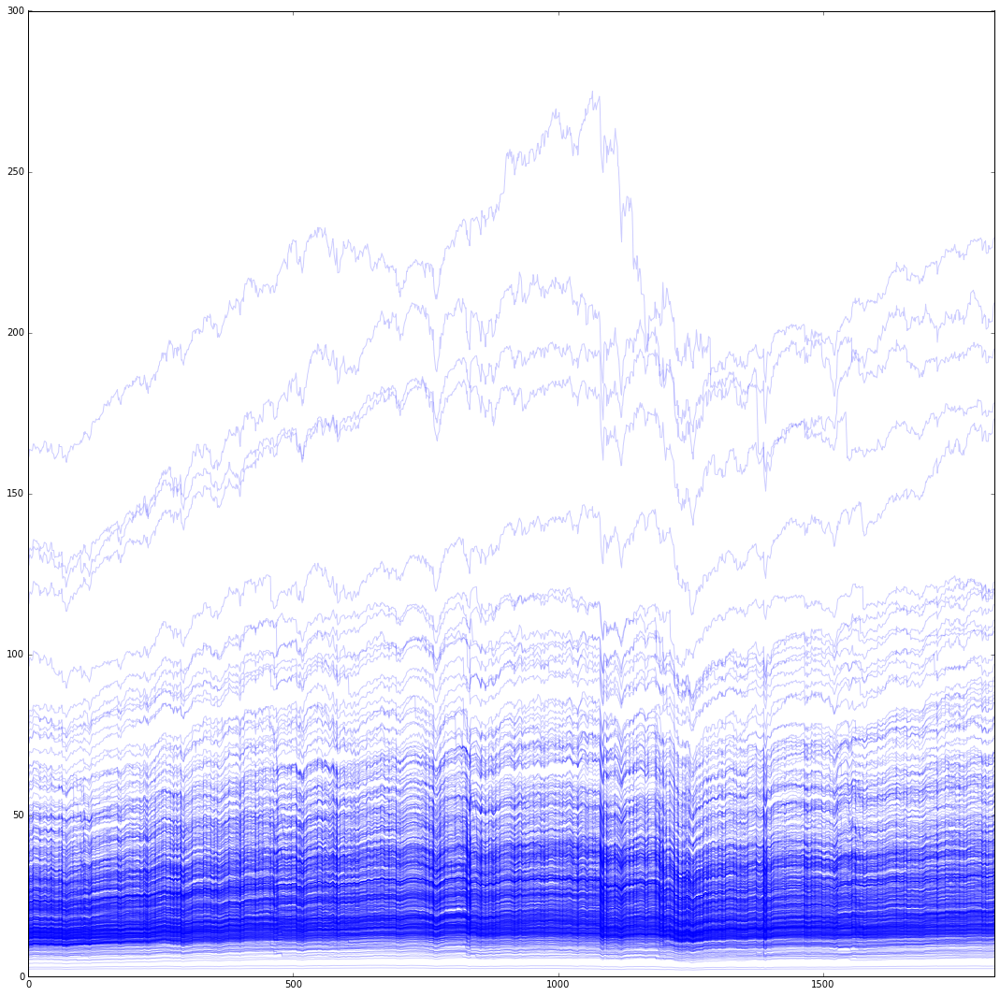

In [13]:
fig, ax = plt.subplots()
fig.set_size_inches(18.5, 18.5)
ax = sns.tsplot(data=timeseries_set.values,err_style="unit_traces")

### Using Hierarchical clustering approach for cluster the stock time series data

linkage methods we tried here:
- single linkage ( shortest distance between two points in each cluster)
- ward linkage (minimal increase of sum of squares)
- average linkage (average distance between all points in each cluster)

In [14]:
correlation_matrix = timeseries_set.T.corr(method='spearman')
Z_single = hac.linkage(correlation_matrix, 'single')
Z_ward = hac.linkage(timeseries_set, 'ward')
Z_average = hac.linkage(timeseries_set,'average')

In [ ]:
#correlation_matrix

In [16]:
Z_single[0]
Z_ward[0]

array([ 113.        ,  201.        ,    0.77968566,    2.        ])

In [42]:
# Plot the dendogram
def plot_dendogram(Z, title):
    plt.figure(figsize=(25, 10))
    plt.title('Hierarchical Clustering Dendrogram for {}'.format(title) )
    plt.xlabel('index')
    plt.ylabel('distance')
    hac.dendrogram(
        Z,
        leaf_rotation=90.,  # rotates the x axis labels
        leaf_font_size=8.,  # font size for the x axis labels
    )
    plt.show()
    
def plot_truncated_dendogram(Z, title, p_num):
    plt.figure(figsize=(25, 10))
    plt.title('Truncated Hierarchical Clustering Dendrogram for {}'.format(title))
    plt.xlabel('index')
    plt.ylabel('distance')
    hac.dendrogram(
        Z,
        truncate_mode='lastp',  # show only the last p merged clusters
        p=p_num,  # show only the last p merged clusters
        show_leaf_counts=True,  # otherwise numbers in brackets are counts
        leaf_rotation=90.,  # rotates the x axis labels
        leaf_font_size=8.,  # font size for the x axis labels
        show_contracted=True,  # to get a distribution impression in truncated branches
    )
    plt.show()

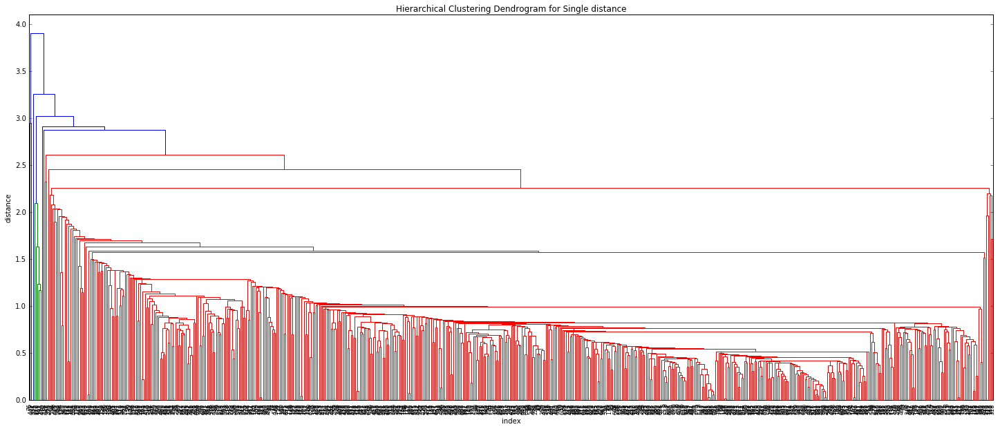

In [18]:
plot_dendogram(Z_single, 'Single distance')

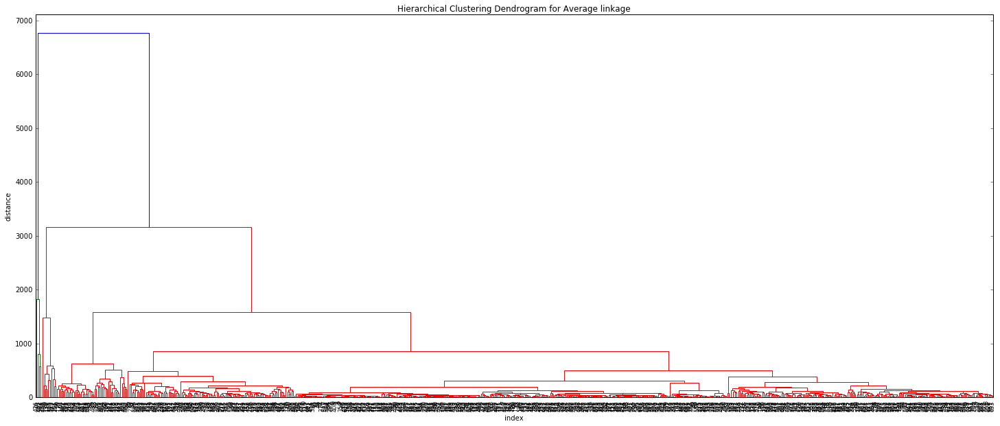

In [19]:
plot_dendogram(Z_average, 'Average linkage')

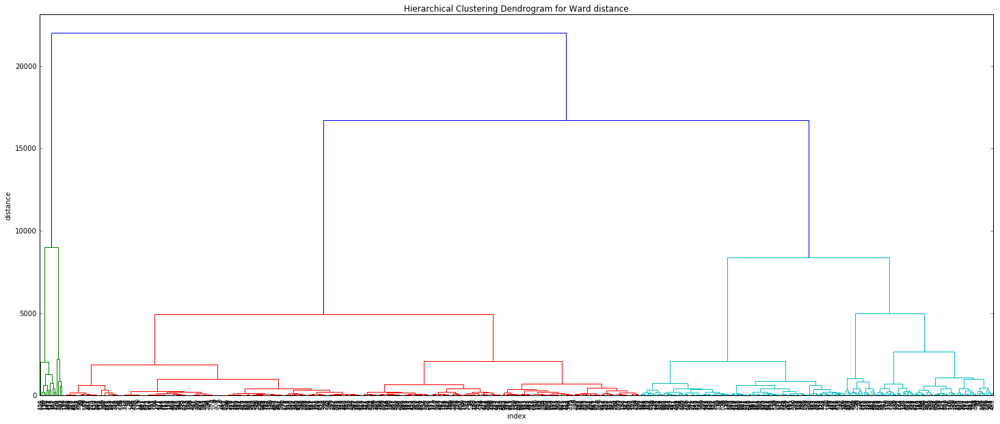

In [20]:
plot_dendogram(Z_ward, 'Ward distance')

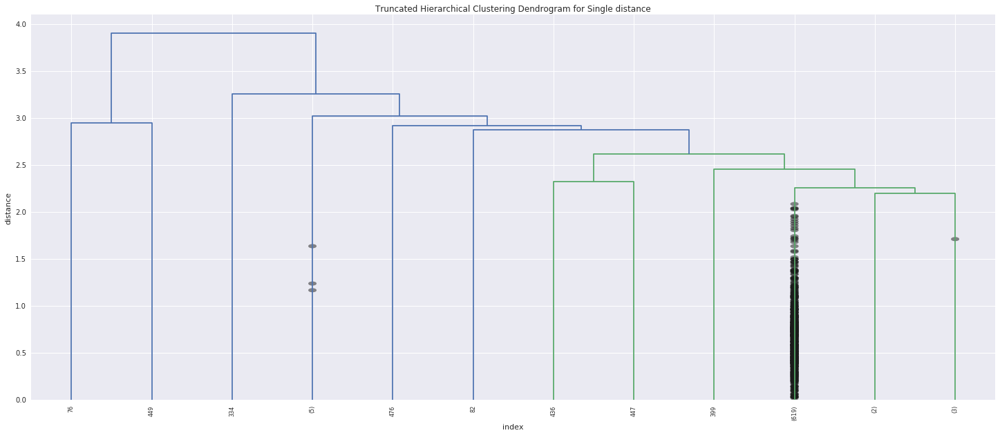

In [31]:
plot_truncated_dendogram(Z_single, 'Single distance',12)

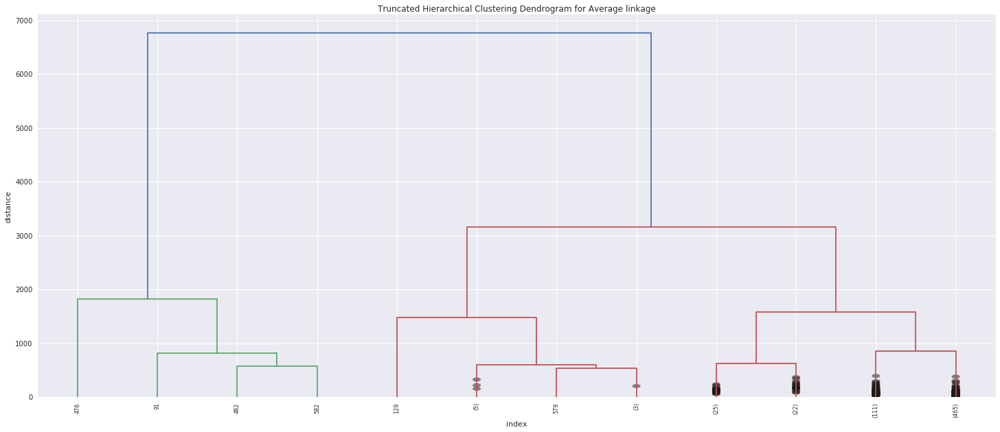

In [44]:
plot_truncated_dendogram(Z_average, 'Average linkage',12)

### we focus on hierarchical ward linkage clustering dendogram and try to find the suitable cut-off distance. from the following graph, it shows the distance at 2500 will show a big jump. we can use it to do a cut off and judge by graph, the cluster k value is around 8

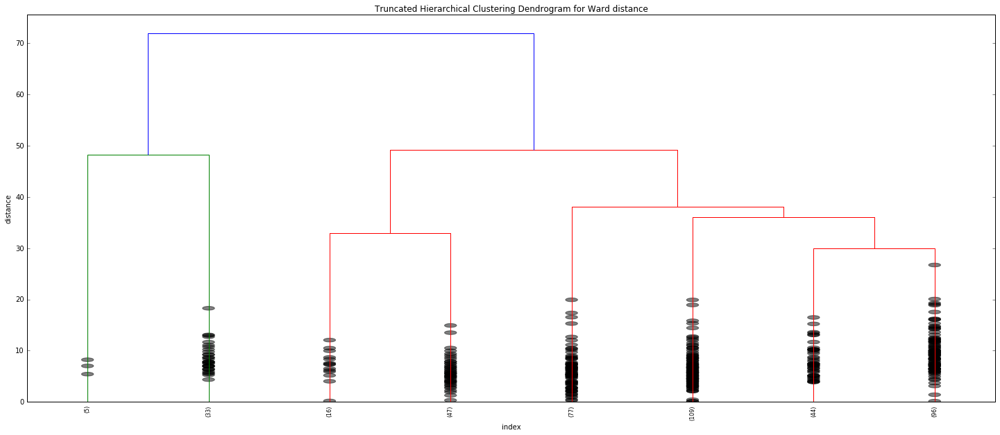

In [360]:
plot_truncated_dendogram(Z_ward, 'Ward distance',8)

## normalize the time series data and apply the clustering scheme again

#### normalize data using preprocessing.normalize() which is to use mean and standard deviation to scale data into (0,1) range

In [91]:
from sklearn import preprocessing
# Normalize the time series data
normalized_timeseries_set = preprocessing.normalize(timeseries_set)
normalized_timeseries_set.shape
normialized_ts = timeseries_set.copy()
normialized_ts.loc[:,:] = normalized_timeseries_set
# keep the column and index names by using pandas loc 
normialized_ts.head(2)

timepoint,1,2,3,4,5,6,7,8,9,10,...,1815,1816,1817,1818,1819,1820,1821,1822,1823,1824
symbol,,,,,,,,,,,,,,,,,,,,,
AACTX,0.019954,0.019934,0.020182,0.020264,0.020244,0.020223,0.020202,0.020264,0.020285,0.020491,...,0.025449,0.025428,0.025470,0.025477,0.025484,0.025490,0.025490,0.025511,0.025614,0.025635
AADTX,0.019099,0.019079,0.019374,0.019472,0.019446,0.019420,0.019394,0.019453,0.019492,0.019708,...,0.025648,0.025629,0.025668,0.025675,0.025681,0.025688,0.025688,0.025727,0.025845,0.025865


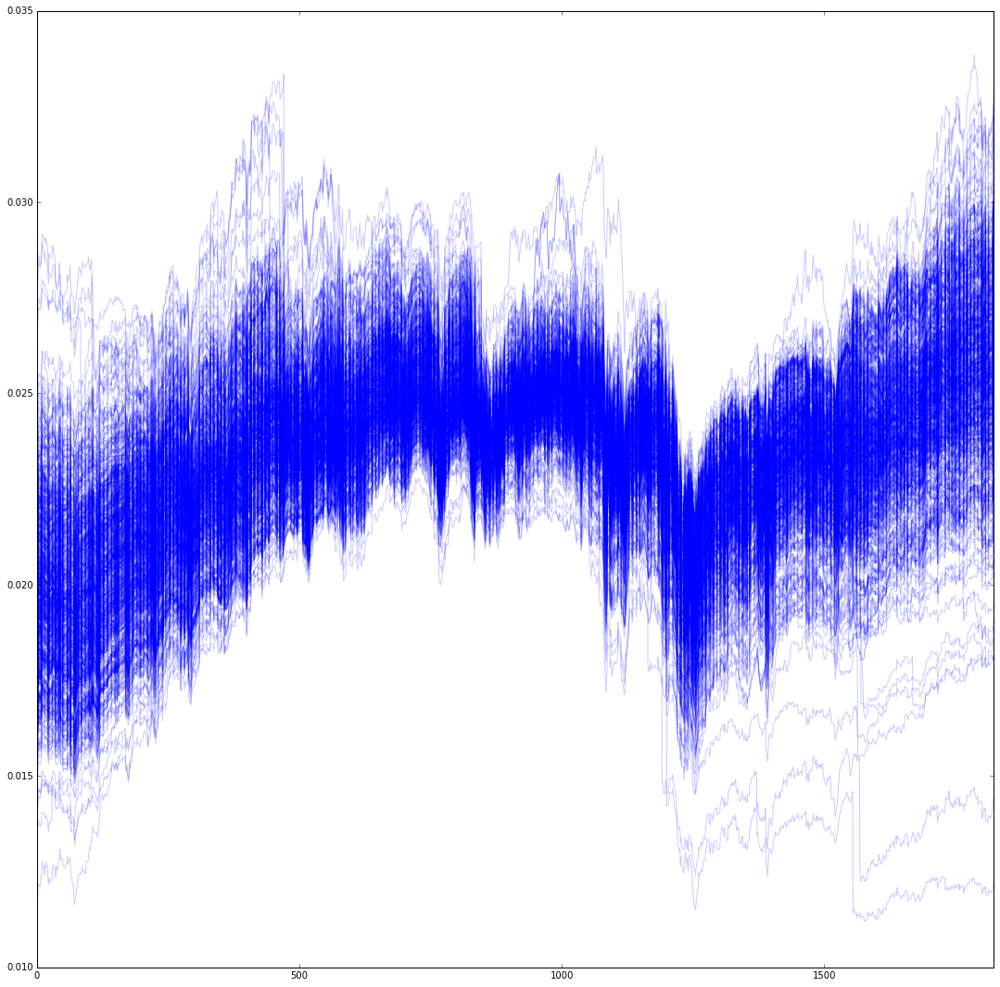

In [38]:
fig, ax = plt.subplots()
fig.set_size_inches(18.5, 18.5)
ax = sns.tsplot(data=normalized_timeseries_set,err_style="unit_traces")

#### normalize data using shift. Considering in this case, we really concern about each mutual fund closing  price variance along the time line. we need to  remove the common upward trend for all mutual funds using closePrice(t) - closePrice(t-1).

In [92]:
normalized_ts_shift = timeseries_set - timeseries_set.shift(1,axis = 1)
# remove the first column, since it contains NaN
normalized_ts_shift_rm = normalized_ts_shift.iloc[:,1:]
print(normalized_ts_shift_rm.head(1))

timepoint  2     3     4     5     6     7     8     9     10    11    ...   \
symbol                                                                 ...    
AACTX     -0.01  0.12  0.04 -0.01 -0.01 -0.01  0.03  0.01   0.1  0.03  ...    

timepoint  1815  1816  1817      1818      1819      1820  1821  1822  1823  \
symbol                                                                        
AACTX       0.0 -0.01  0.02  0.003333  0.003333  0.003333   0.0  0.01  0.05   

timepoint  1824  
symbol           
AACTX      0.01  

[1 rows x 1823 columns]


/gpfs/fs01/user/sfdb-2095b6be7f15a4-029a8c7f11e3/.local/lib/python3.5/site-packages/seaborn/timeseries.py:183: UserWarning: The tsplot function is deprecated and will be removed or replaced (in a substantially altered version) in a future release.
  warnings.warn(msg, UserWarning)


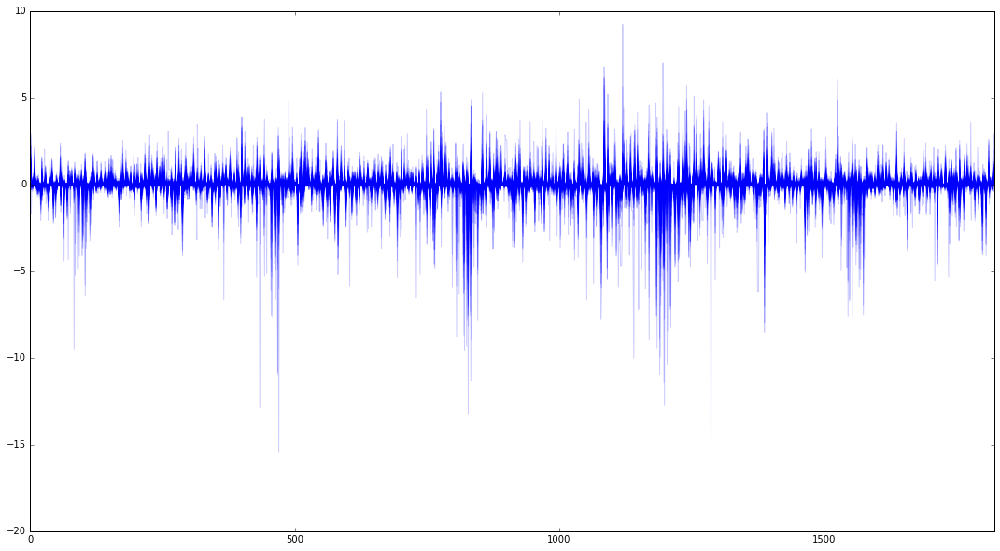

In [93]:
fig, ax = plt.subplots()
fig.set_size_inches(18.5, 10)
ax = sns.tsplot(data=normalized_ts_shift_rm.values,err_style="unit_traces")

### Conclusion from the above two normalization schemes, we think that the second approach is better for our dataset in hand. the following analysis will based on the normalized result from it.

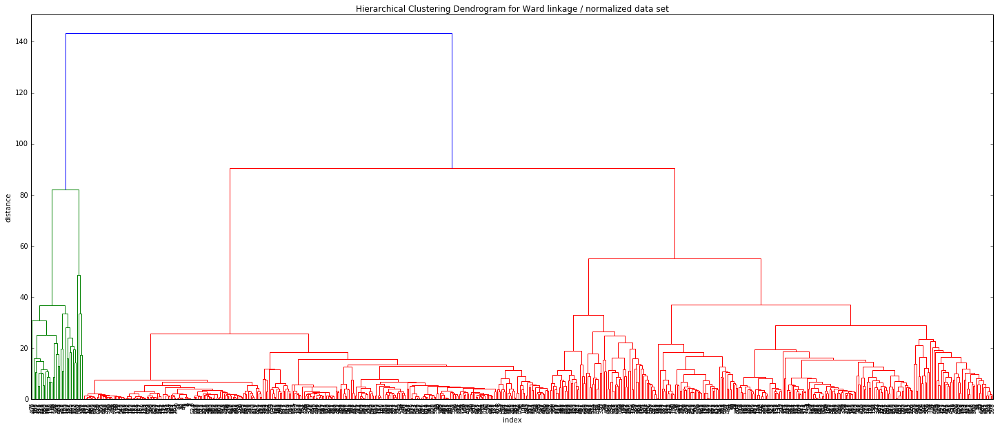

In [94]:
Z_ward_on_norm_data = hac.linkage(normalized_ts_shift_rm, 'ward')
plot_dendogram(Z_ward_on_norm_data, 'Ward linkage / normalized data set')

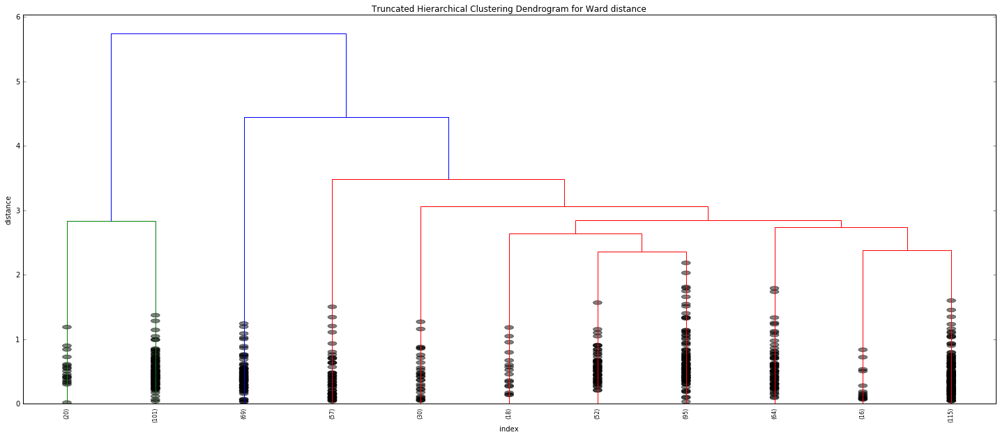

In [40]:
plot_truncated_dendogram(Z_ward_on_norm_data, 'Ward distance',11)

### hierarchical clustering analysis
- ### From the dendograms we got from three linkage methods, that is single, average, ward, we can get conclusion that single linkage is not suitable to this problem. Considering we are dealing with a time series clustering problem, we care more about within same cluster, funds have the same pattern and between clusters, there is different nuances being detected out. Obviously, single linkage doesn't quite fit this case, since it doesn't really put all data points in the cluster into the consideration.
- ### comparing the average with the ward, average calculates the mean, while ward pays attention on variance. If we look into this particular dataset, we need to consider the variance along the timeline for each stock in order to define the similar stocks. Thus, theoretically, ward will give us better clustering results.
- ### comparing with the data with and without normalization, we get the conclusion that normalized data gives better clustering result, especially when we normalize data using the characteristics of the stock dataset. 
- ### we play with truncating the dendogram tree and try to find the huge jump in distance which will be the indicator for the suitable K value. We focus on ward linkage dendogram and use 11 as cluster k value


### k-mean clustering

In [390]:
from sklearn.metrics import silhouette_score
def calculate_sil_score_km(n_clusters, dataset):
    kmeans_cluster = KMeans(init='k-means++', n_clusters=n_clusters, n_jobs = 10, random_state=0).fit(dataset)
    labels = kmeans_cluster.predict(dataset)
    print('{} clusters have silhouette score {}'.format(n_clusters, silhouette_score(dataset, labels, metric='euclidean')))
    return labels

In [391]:
for k in [8, 11, 12,13,20,50]:
    _ = calculate_sil_score_km(k, normalized_ts_shift_rm)

8 clusters have silhouette score 0.19816063822850988
11 clusters have silhouette score 0.17481741925372746
12 clusters have silhouette score 0.17682173746417476
13 clusters have silhouette score 0.20894117477918533
20 clusters have silhouette score 0.14410133500304528
50 clusters have silhouette score 0.16526796409527517


In [388]:
# find the best k 
from scipy.spatial.distance import cdist, pdist

def compute_ssq(data, k, kmeans):
    '''
    'This function refers to http://saravanan-thirumuruganathan.github.io/cse5334Spring2015/assignments/PA3/PA3_Clustering_DimensionalityReduction.html
    '''
    dist = np.min(cdist(data, kmeans.cluster_centers_, 'euclidean'), axis=1)
    tot_withinss = sum(dist**2) # Total within-cluster sum of squares
    totss = sum(pdist(data)**2) / data.shape[0] # The total sum of squares
    betweenss = totss - tot_withinss # The between-cluster sum of squares
    return betweenss/totss*100

def elbow_plot(maxk):
    arr = np.array(maxk*[0])
    distortions = []
    for k in range(1,maxk):
        kmeans = KMeans(init='k-means++', n_clusters=k, random_state=0).fit(normalized_ts_shift_rm)

        distortions.append(compute_ssq(normalized_ts_shift_rm, k, kmeans))
        arr[k-1]=kmeans.inertia_

    fig, ax = plt.subplots()
    plt.xlabel("Num. of Clusters")
    #plt.ylabel("Sum of within cluster variation")
    plt.ylabel('Sum of between cluster variance ratio')
    #plt.annotate("*",(3,arr[2]-30),size = 20)
    #plt.plot(range(1,maxk),arr[:maxk-1])
    plt.plot(range(1,maxk),distortions)
    plt.show()

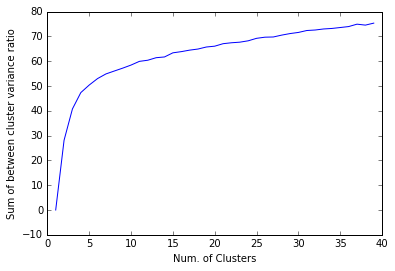

In [389]:
maxk = 40
elbow_plot(40)

#### Using silhouette score, we can get K= 13 gives the highest score. Using elbow method, look like elbow range also between 5 to 15. So we can pick K = 13 for our Kmeans 

### DBscan clustering algorithm

In [254]:
from sklearn.cluster import DBSCAN
from sklearn import metrics
def dbscan_fit(eps,min_samples, data_set):
    #eps parameter is the maximum distance between two data points to be considered in the same neighborhood.
    #The min_samples parameter is the minimum amount of data points in a neighborhood to be considered a cluster.

    db = DBSCAN(eps=eps, min_samples=min_samples).fit(data_set)
    core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
    core_samples_mask[db.core_sample_indices_] = True
    dbscan_clusters = db.labels_

    # Number of clusters in labels, ignoring noise if present.
    num_clusters = len(set(dbscan_clusters)) - (1 if -1 in dbscan_clusters else 0)

    print('When eps is {}, minimum data points is {}, estimated number of clusters: {}'.format(eps,min_samples,num_clusters))
    if num_clusters > 1:
        print('Silhouette score {}'.format(silhouette_score(data_set, dbscan_clusters + 1, metric='euclidean')))
    else:
        print('No Silhouette score')

    return dbscan_clusters

In [255]:
for (eps,min_samples) in [(2,3),(1,3),(1,2),(0.5,3),(0.5,2)]:
    dbscan_fit(eps,min_samples, normalized_ts_shift_rm)

When eps is 2, minimum data points is 3, estimated number of clusters: 3
Silhouette score -0.031105676002966078
When eps is 1, minimum data points is 3, estimated number of clusters: 6
Silhouette score -0.3530501893432066
When eps is 1, minimum data points is 2, estimated number of clusters: 27
Silhouette score -0.3305770160311921
When eps is 0.5, minimum data points is 3, estimated number of clusters: 4
Silhouette score -0.3828588825064153
When eps is 0.5, minimum data points is 2, estimated number of clusters: 21
Silhouette score -0.38996635364124665


In [256]:
dscan_clusters = dbscan_fit(0.5,2, normalized_ts_shift_rm)

When eps is 0.5, minimum data points is 2, estimated number of clusters: 21
Silhouette score -0.38996635364124665


### we use the DBscan method here to try density clustering scheme. from the kmeans and hc cluster, we know that we do have several outliers in the dataset, so when we choose

### Affinity Propagation clustering algorithm

In [552]:
from sklearn.cluster import AffinityPropagation
def ap_cluster(pre, dataset, ret_label = False):
    for pre in pre:
        af = AffinityPropagation(preference=pre).fit(dataset)
        cluster_centers_indices = af.cluster_centers_indices_
        ap_labels = af.labels_
        n_clusters_ = len(cluster_centers_indices)
        shl_score = silhouette_score(dataset, ap_labels, metric='euclidean')
        print('For preference =',pre,', estimated number of clusters: %d' % n_clusters_, 'Silhouette score', shl_score)
    if ret_label:
        return ap_labels

In [553]:
ap_cluster([-1000, -800, -600, -400, -200],normalized_ts_shift_rm)

For preference = -1000 , estimated number of clusters: 6 Silhouette score 0.217319278238
For preference = -800 , estimated number of clusters: 7 Silhouette score 0.218796214084
For preference = -600 , estimated number of clusters: 10 Silhouette score 0.0637848510364
For preference = -400 , estimated number of clusters: 14 Silhouette score 0.0914998344235
For preference = -200 , estimated number of clusters: 30 Silhouette score 0.12921819079


##### When preference = -800,  the silhouette score is the highest among all tested  value. the number of cluster is 7

In [562]:
ap_labels = ap_cluster([-800],normalized_ts_shift_rm, True)

For preference = -800 , estimated number of clusters: 7 Silhouette score 0.218796214084


### Mean Shift clustering algorithm

In [544]:
from sklearn.cluster import MeanShift, estimate_bandwidth

for quan in [0.5,0.55, 0.6, 0.65]:
    bandwidth = estimate_bandwidth(normalized_ts_shift_rm.values, quantile=quan, n_samples=500)
    
    ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
    ms.fit(normalized_ts_shift_rm)
    meanShift_labels = ms.labels_
    n_clusters_ = len(np.unique(meanShift_labels))
    
    shl_score = silhouette_score(normalized_ts_shift_rm, meanShift_labels, metric='euclidean')
    print ('quantile:',quan, 'bandwidth:', bandwidth, "number of estimated clusters : %d" % n_clusters_, 'Silhouette score', shl_score)

quantile: 0.5 bandwidth: 7.49920185017 number of estimated clusters : 2 Silhouette score 0.751067750968
quantile: 0.55 bandwidth: 7.81153610602 number of estimated clusters : 2 Silhouette score 0.751067750968
quantile: 0.6 bandwidth: 8.15899124974 number of estimated clusters : 2 Silhouette score 0.751067750968
quantile: 0.65 bandwidth: 8.56982050261 number of estimated clusters : 2 Silhouette score 0.751067750968


####  all tested model results in same number of cluster (n_clusters = 2), which is not quite reaonable based on our former observation in other clustering model. from what we tried here with dbscan and meanshift ( density based clustering methods), we find that they both couldn't provide better result.  The reason could be that in our dataset, distances between the clusters are also not very distinct. we have some outlier, the other just tends to cluster together.

### Birch  clustering algorithm

In [547]:
from sklearn.cluster import Birch
def birch_cluster(k, dataset, ret_label = False):
    for n in k:
        n_clusters=n
        brc = Birch(branching_factor=50, n_clusters=n_clusters, threshold=0.5, compute_labels=True)
        brc.fit(dataset)
        brc_labels = brc.predict(dataset)

        shl_score = silhouette_score(dataset, brc_labels, metric='euclidean')
        print('number of cluster:',n_clusters, '  Silhouette score:', shl_score)
    if ret_label:
        return brc_labels

In [548]:
birch_cluster([5,6,7,8,9,10,11,12,13,14,15],normalized_ts_shift_rm)

number of cluster: 5   Silhouette score: 0.183009364349
number of cluster: 6   Silhouette score: 0.184961084358
number of cluster: 7   Silhouette score: 0.186241766537
number of cluster: 8   Silhouette score: 0.194832441417
number of cluster: 9   Silhouette score: 0.196621280414
number of cluster: 10   Silhouette score: 0.198065223181
number of cluster: 11   Silhouette score: 0.203954405918
number of cluster: 12   Silhouette score: 0.206245679487
number of cluster: 13   Silhouette score: 0.153634327889
number of cluster: 14   Silhouette score: 0.155368639364
number of cluster: 15   Silhouette score: 0.158649573059


#### when number of cluster is 12,   the silhouette score is the highest among all tested models.

In [549]:
brc_labels = birch_cluster([12],normalized_ts_shift_rm, True)

number of cluster: 12   Silhouette score: 0.206245679487


### Problem 1b

[Back to top](#top)

<a id='Problem-1b'></a>

Assess your best clustering approach using one or more appropriate techniques.  While we expect some assessment would be part of the optimization, we are asking you to justify why you selected this one as your best method.  

#### we use silhouette score and plot to assess the models we applied in 1a

In [48]:
#function to calculate and plotsilhouette
def plot_silhouette(n_clusters, X, labels):
    y_lower = 10
    fig, ax1 = plt.subplots(1, 1)

    silhouette_avg = metrics.silhouette_score(X, labels)
    print("Silhouette Coefficient: %0.6f"  % silhouette_avg )

    sample_silhouette_values = silhouette_samples(X, labels)

    for i in range(n_clusters):
        
        ith_cluster_silhouette_values = \
                sample_silhouette_values[labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

13 clusters have silhouette score 0.20894117477918533
Silhouette Coefficient: 0.208941


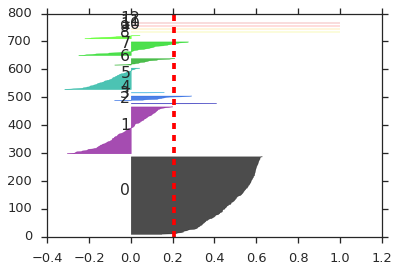

In [465]:
km_clusters = calculate_sil_score_km(13, normalized_ts_shift_rm)
plot_silhouette(13, normalized_ts_shift_rm, km_clusters)

#### from above kmeans result, silhouette suggests us to pick K = 13, since it has higher silhouette score and from the plot, looks like all cluster has certain distance away from each other

In [51]:
def calculate_sil_score_hc(n_clusters):
    labels = fcluster(Z_ward_on_norm_data, n_clusters, criterion='maxclust')
    print('HC scheme: {} clusters have silhouette score {}'.format( n_clusters, silhouette_score(normalized_ts_shift_rm, labels, metric='euclidean')))

In [52]:
for k in [8,9,10,11,12,13]:
    calculate_sil_score_hc(k)

HC scheme: 8 clusters have silhouette score 0.212239006031352
HC scheme: 9 clusters have silhouette score 0.21402784502808275
HC scheme: 10 clusters have silhouette score 0.21547227809381578
HC scheme: 11 clusters have silhouette score 0.22182645358509667
HC scheme: 12 clusters have silhouette score 0.22414464345497567
HC scheme: 13 clusters have silhouette score 0.1784337671101667


Silhouette Coefficient: 0.221826


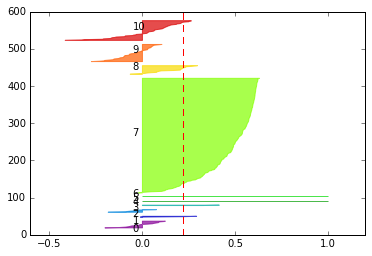

In [53]:
hc_clusters = fcluster(Z_ward_on_norm_data, 11, criterion='maxclust')
plot_silhouette(11, normalized_ts_shift_rm, hc_clusters)

#### from above hc cluster silhouette scores, we can pick K = 11, which gives 0.22 as highest score.

Silhouette Coefficient: 0.218796


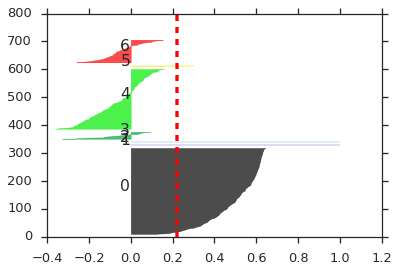

In [563]:
# affinity propogation silhouette plot
plot_silhouette(7, normalized_ts_shift_rm, ap_labels)

Silhouette Coefficient: 0.206246


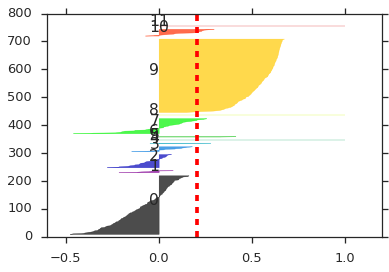

In [540]:
# birch clustering silhouette plot
plot_silhouette(12, normalized_ts_shift_rm, brc_labels)

Silhouette Coefficient: 0.751068


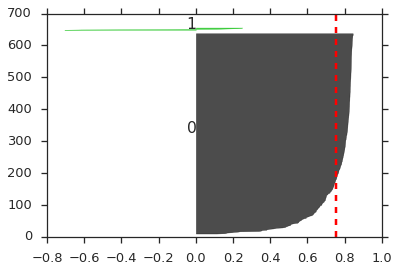

In [546]:
# meanshift clustering silhouette plot
plot_silhouette(2, normalized_ts_shift_rm, meanShift_labels)

#### let's also assess our result by drawing out the mutual fund time series plot by grouping funds together based on the returned clusters. By looking at each cluster time series plot, we have visual feeling about which scheme really clusters the similar trend of mutual funds together

In [478]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [251]:
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
def draw_cluster_timeseries_ds(c_name,label_num, dataset, plot = True):
    """draw the clustered time series plot for mutual funds
    params: c_name: the name of the cluster object which contains the cluster labels
    params: label_num: the variable indicates which cluster we want to draw
    """
    if label_num == 0:
        y_label, counts = np.unique(c_name, return_counts=True)
        print(np.asarray((y_label, counts)).T)
    df_norm_ts_set = dataset.copy()
    df_norm_ts_set['label'] = c_name
    #print(df_norm_ts_set.head(1))
    # get the sub_df which only include a set of mutual funds which belong to the same label
    sub_df = df_norm_ts_set[df_norm_ts_set['label'] == label_num]
    #print(sub_df.head(3))
    if(plot):
        fig, ax = plt.subplots()
        fig.set_size_inches(15, 5)
        cols = [col for col in sub_df.columns if col not in ['label']]
        ax = sns.tsplot(data=sub_df[cols].values,err_style="unit_traces")

#### the list below is the clusters returned by applying dBscan clustering method on normalized data using k = 21 clusters, from the list, we can see that dbscan puts 576 mutual funds into the same cluster, which is not a good clustering, and silhouette score is also on the negative side indicating wrong clustering.

In [266]:
dscan_clusters = dbscan_fit(0.5,2, normalized_ts_shift_rm)
k = 21
for i in range(20):
    draw_cluster_timeseries_ds(dscan_clusters + 1,i,timeseries_set, False)
    #draw_cluster_timeseries(dbscan_clusters + 1,i)

When eps is 0.5, minimum data points is 2, estimated number of clusters: 21
Silhouette score -0.38996635364124665
[[  0 576]
 [  1  10]
 [  2   2]
 [  3   2]
 [  4   2]
 [  5   3]
 [  6   2]
 [  7   2]
 [  8   2]
 [  9   2]
 [ 10   9]
 [ 11   2]
 [ 12   2]
 [ 13   2]
 [ 14   2]
 [ 15   2]
 [ 16   5]
 [ 17   2]
 [ 18   2]
 [ 19   2]
 [ 20   2]
 [ 21   2]]


#### the figure below is the clusters returned by applying kmeans clustering method on normalized data using k = 13 clusters

[[  0 279]
 [  1 169]
 [  2   2]
 [  3  17]
 [  4   2]
 [  5  78]
 [  6  24]
 [  7  50]
 [  8  12]
 [  9   1]
 [ 10   1]
 [ 11   1]
 [ 12   1]]


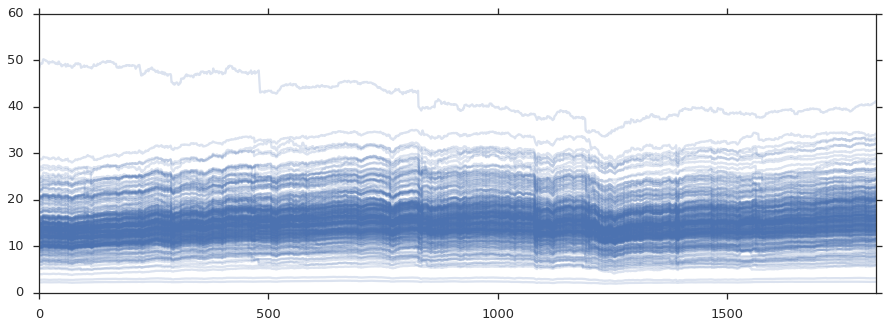

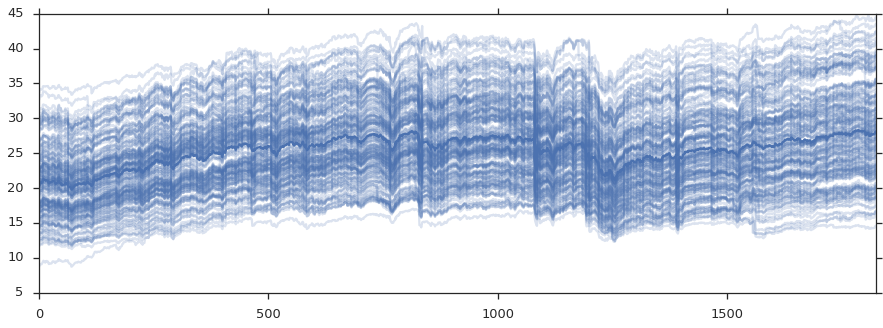

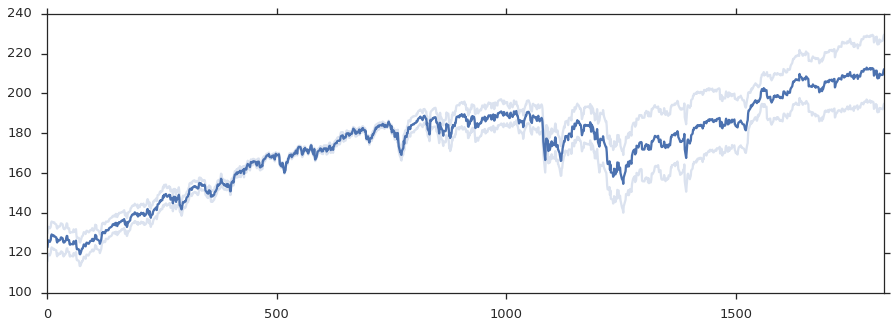

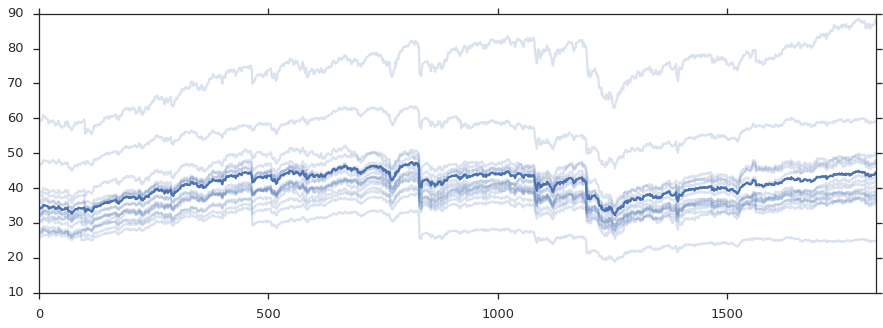

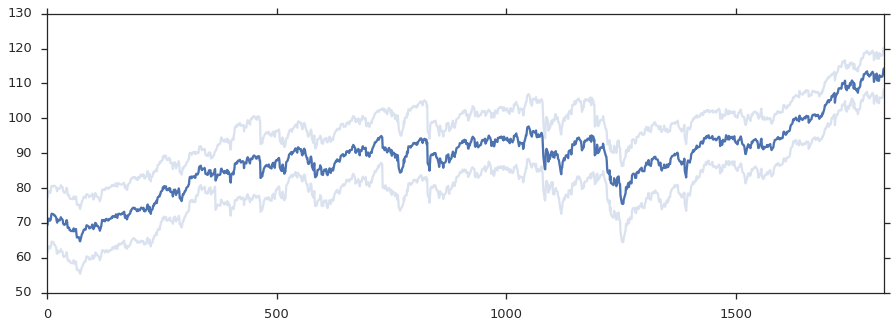

...

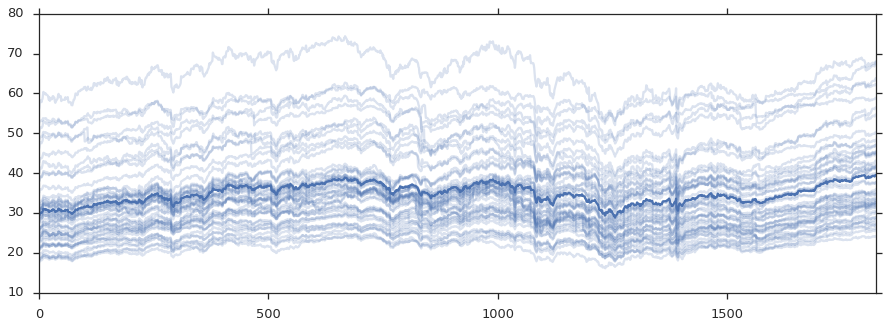

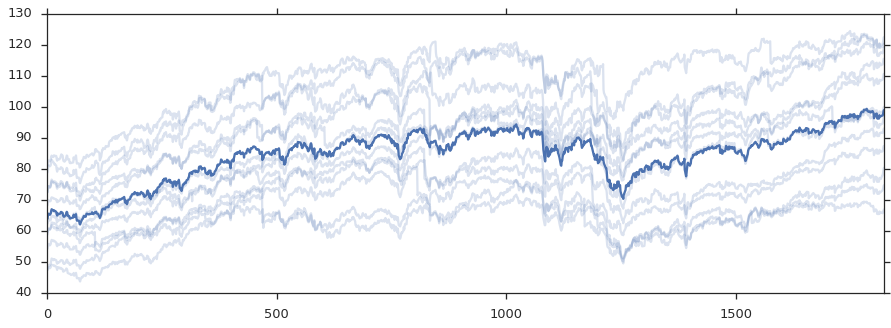

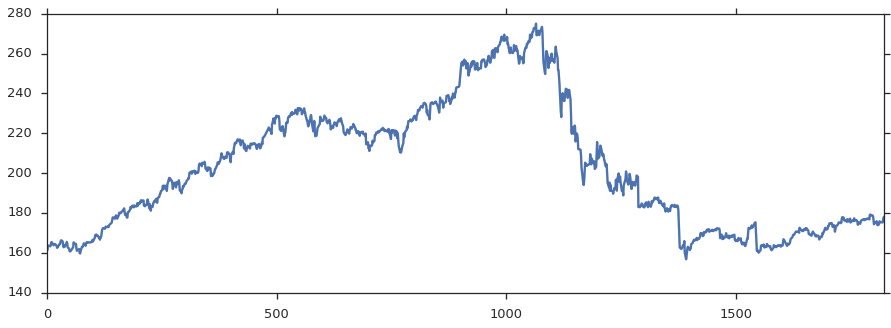

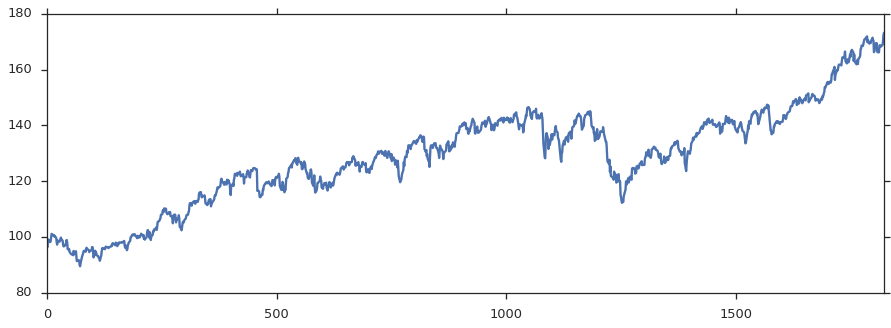

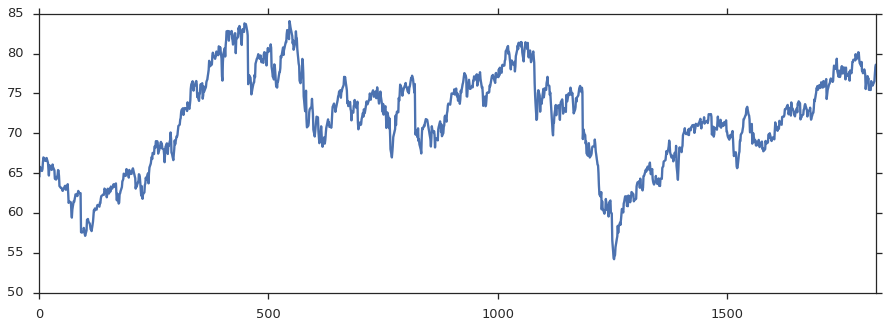

In [506]:
k = 13
for i in range(k-1):
    draw_cluster_timeseries_ds(km_clusters,i,timeseries_set, True)

#### the figure below is the clusters returned by applying hierachical clustering method on normalized data using k = 11 clusters

In [371]:
from scipy.cluster.hierarchy import fcluster
k = 11
hc_clusters_on_norm_data = fcluster(Z_ward_on_norm_data, k, criterion='maxclust')

[[  0  19]
 [  1   3]
 [  2   8]
 [  3   2]
 [  4   1]
 [  5   1]
 [  6 309]
 [  7  24]
 [  8  47]
 [  9  54]
 [ 10 169]]


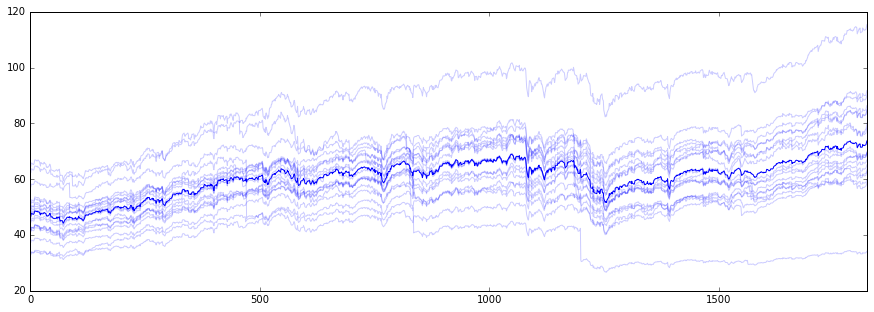

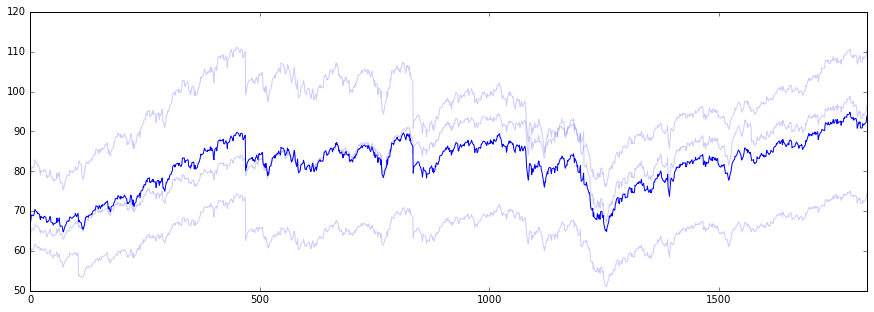

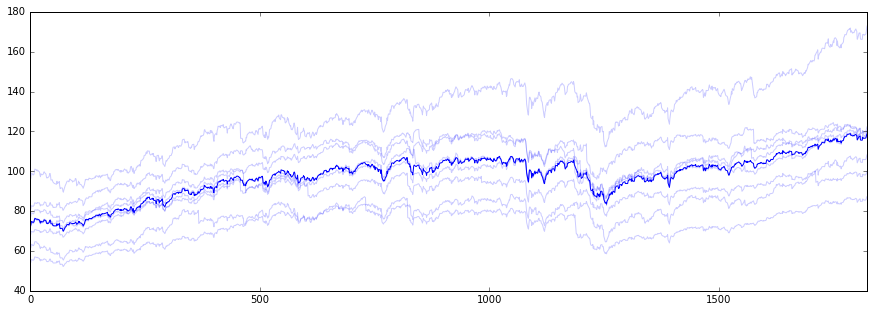

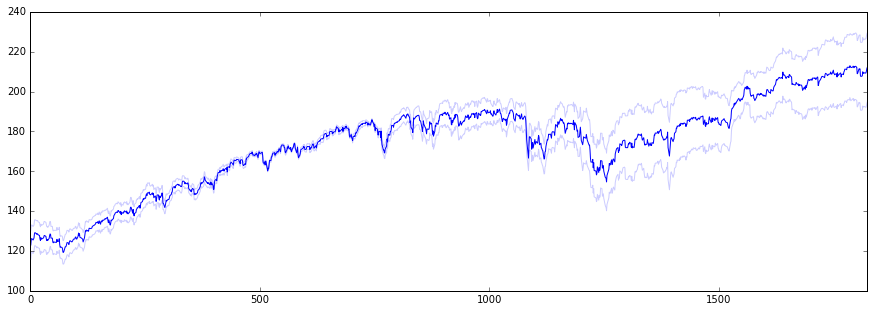

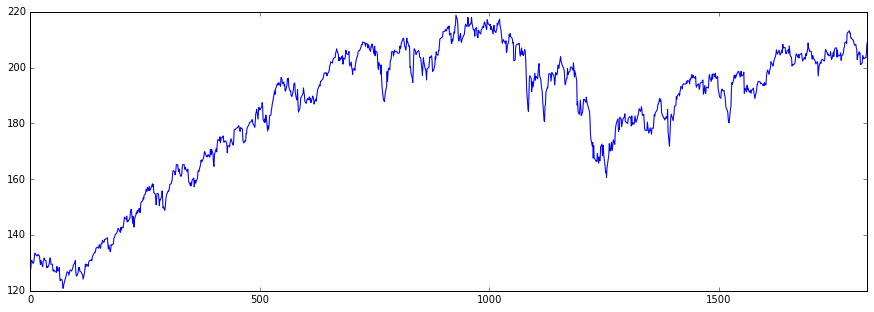

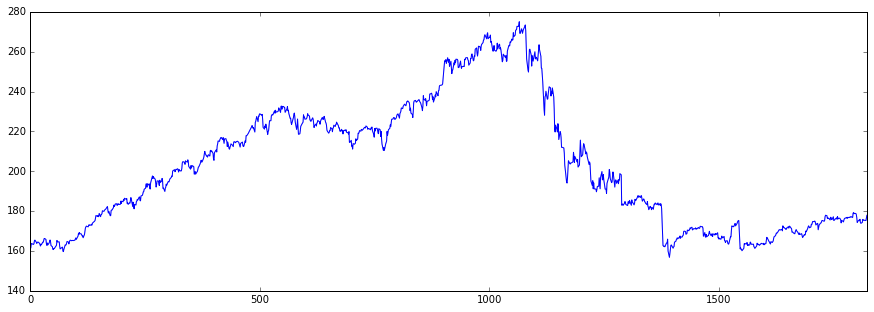

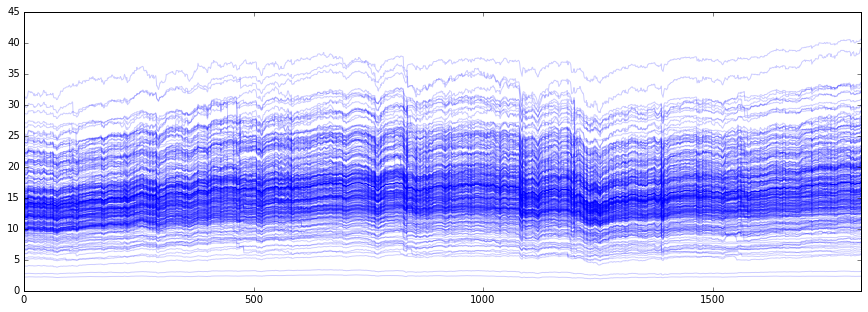

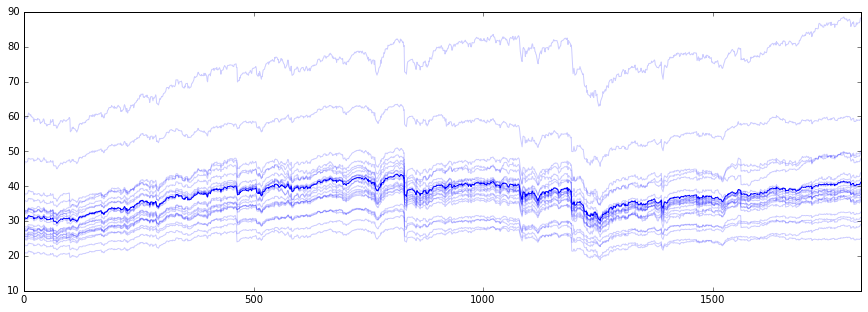

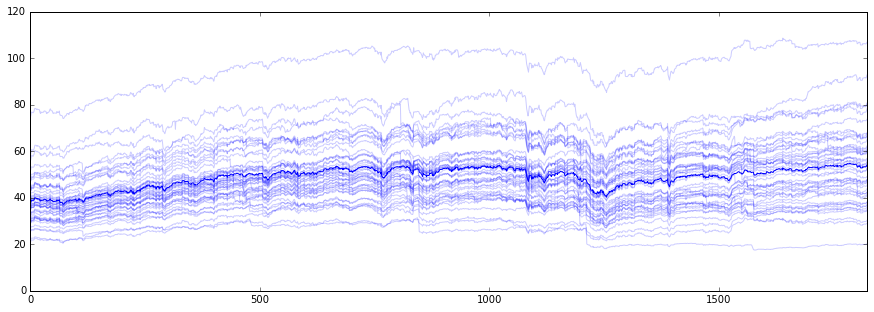

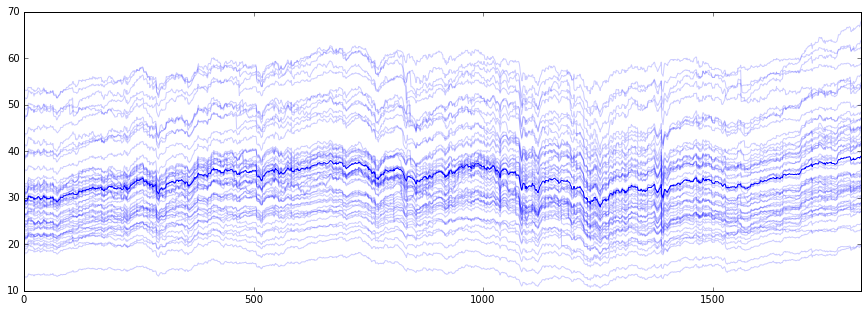

In [372]:
# pay attention here: clusters from fccluster starts from 1 instead of 0
# which is different from kmeans

for i in range(k-1):
    draw_cluster_timeseries_ds(hc_clusters_on_norm_data - 1, i, timeseries_set, True)


### Conclusion from the above observations:
- ### DBscan method clusters 576 mutual funds into the same cluster, which doesn't consider the good performance, even the rest of clusters do look distinct from each other
- ### Kmeans returns nice set of clusters when K = 13. In problem 1, we use both the silhouette score and elbow method to test the suitable K value, we pick 13 since it gives highest silhouette score and fits the elbow range.
- ### hierarchical cluster, we pick K = 11, since its silhouette score is high, also show the biggest jump in dendogram.
- ### from the clustered stock time series plot, we can visualize that both kmeans and hc cluster differentiate some distinct trend patterns in their clusters. Especially, they both single out 2 outliers in the whole dataset, which is reasonable, judging by the visualization of the clusters. But hard to tell which one is better.
- ### Affinity Propogration clustering: K = 7 preference = -800 ,  Silhouette score 0.22
- ### using Birch clustering, we pick K = 11, silhouette score 0.2
- ### meanshift just gave back 2 cluster, even with silhouette score 0.75, we know that the custering is bad.

### Problem 1c 

[Back to top](#top)

<a id='Problem-1c'></a>

Using an approach of your choosing, compare your clustering against that of Morningstar classes.  This should not be the criteria for 1b.

[ 0  1  2  3  4  5  6  7  8  9 10]
[[  0 149]
 [  1  56]
 [  2 133]
 [  3  86]
 [  4  24]
 [  5  81]
 [  6  16]
 [  7  39]
 [  8  14]
 [  9  22]
 [ 10  17]]


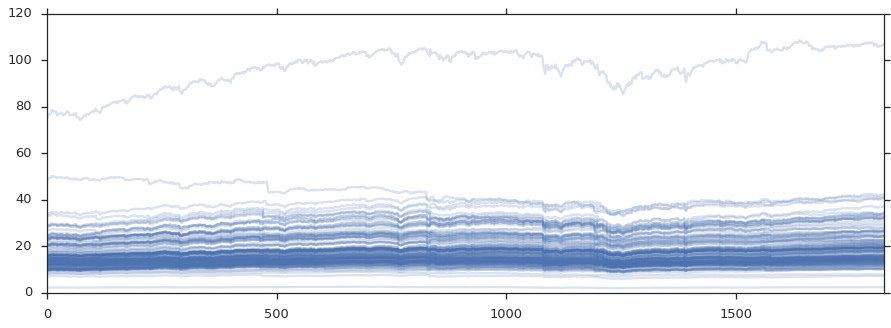

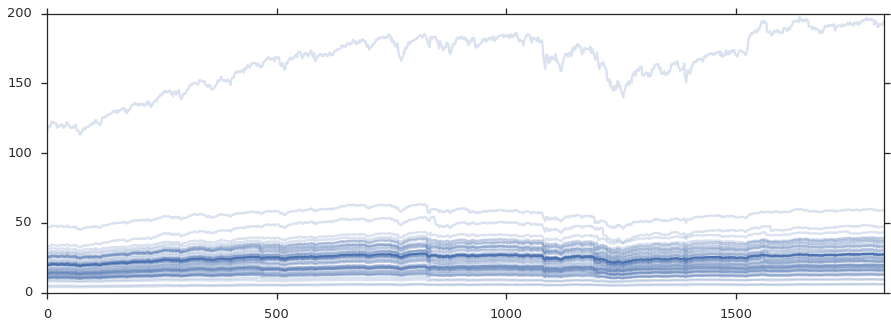

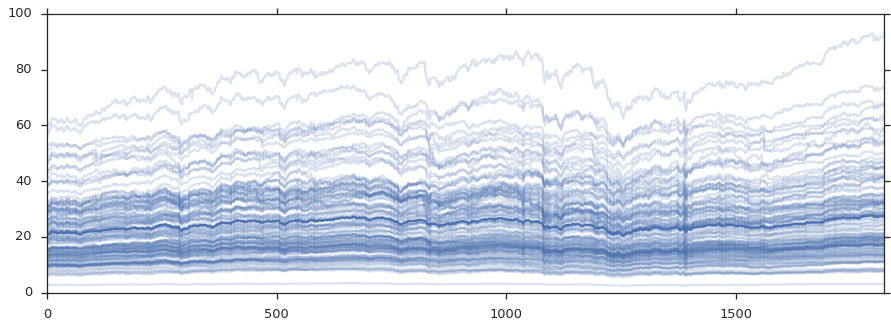

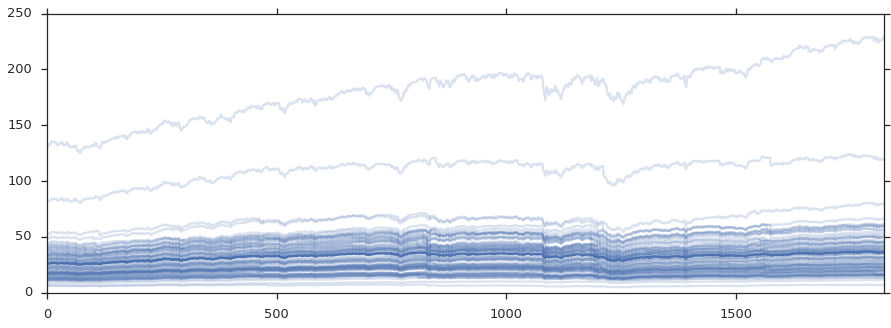

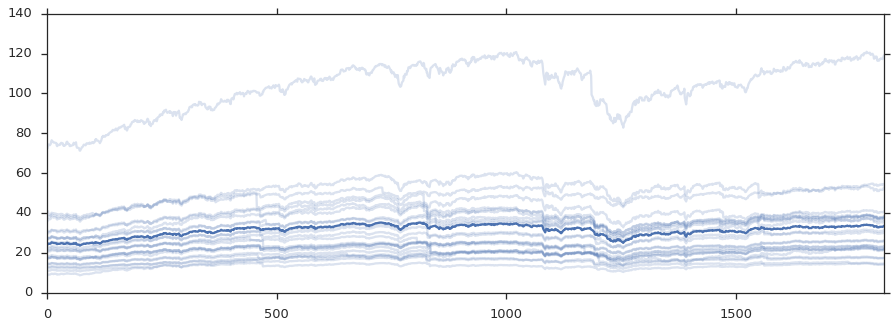

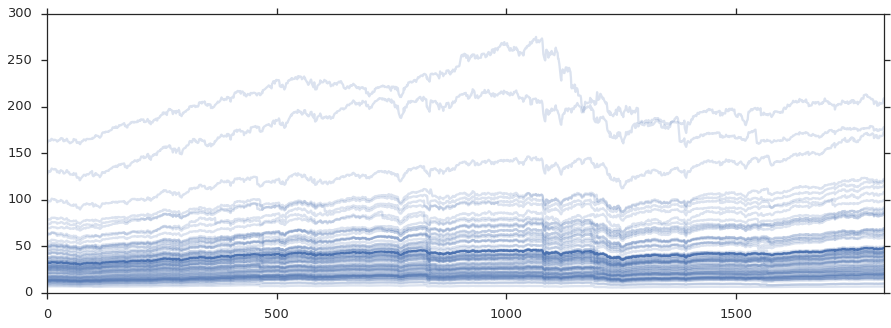

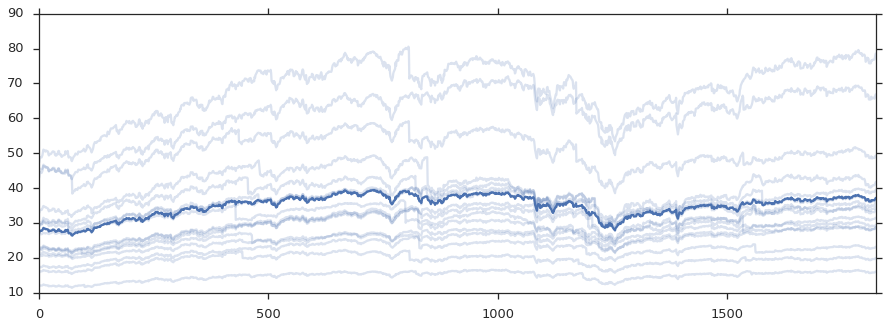

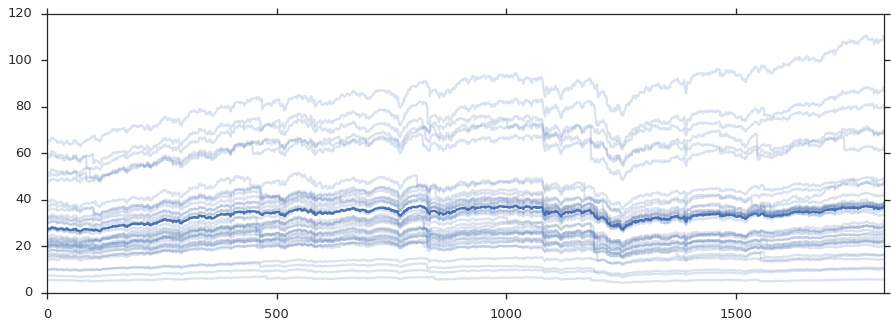

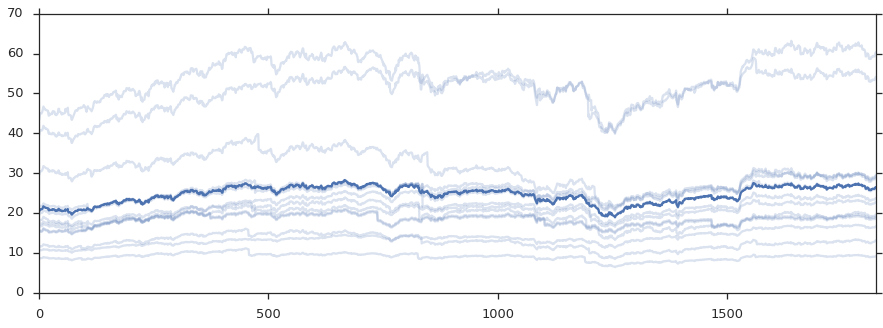

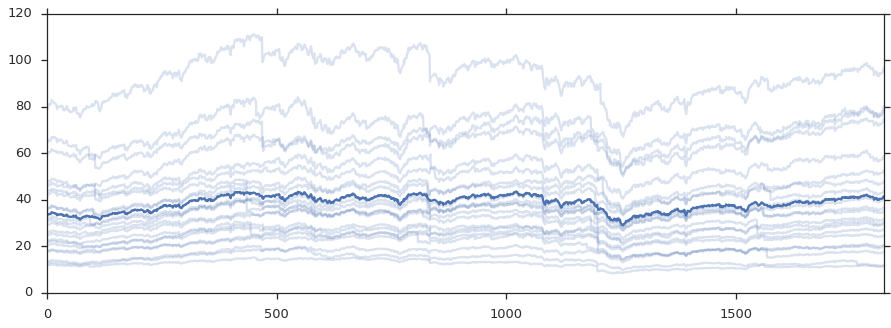

In [505]:
type_index = [i for i in range(len(mf_from_file['type'].unique()) )]
type_map = dict(zip(mf_from_file['type'].unique(), type_index))

df_norm_ts_new = timeseries_set.copy()
symbol_map = mf_from_file[['symbol','type']]
symbol_map.reset_index(drop=True,inplace=True)
symbol_map.drop_duplicates(inplace = True)
symbol_map.set_index('symbol', inplace = True)
symbol_dict = symbol_map.to_dict()
# when we have index, it's easier to do the mapping for type this way
df_norm_ts_new['type'] = symbol_map['type']
#df_norm_ts_new['type']
df_norm_ts_new['type'] = df_norm_ts_new['type'].map(type_map)
mstar_cluster = df_norm_ts_new['type'].as_matrix()
k = len(np.unique(mstar_cluster))
print(np.unique(mstar_cluster))
#sns.set(color_codes=True)
for i in range(k - 1):
    draw_cluster_timeseries_ds(mstar_cluster, i, timeseries_set, True)

In [191]:
print('morningstar cluster silhouette score is {}'.format(silhouette_score(normalized_ts_shift_rm, mstar_cluster, metric='euclidean')))

morningstar cluster silhouette score is -0.057793762996885545


Silhouette Coefficient: 0.032746


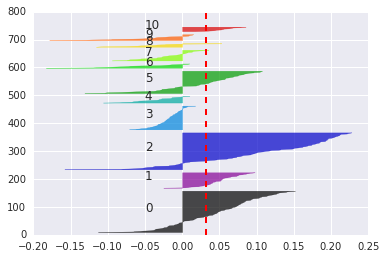

In [153]:
plot_silhouette(11, normalized_ts_shift_rm, mstar_cluster)

Silhouette Coefficient: -0.040381


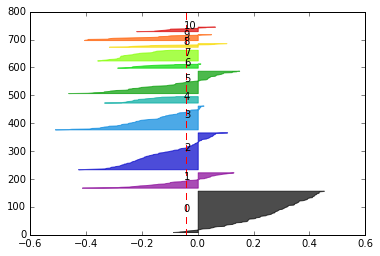

In [192]:
plot_silhouette(11, normialized_ts, mstar_cluster)

Silhouette Coefficient: -0.189883


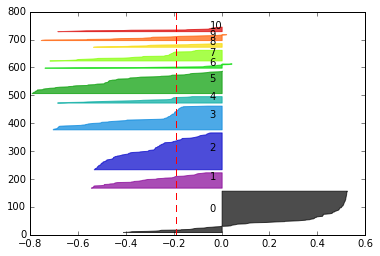

In [193]:
plot_silhouette(11, timeseries_set, mstar_cluster)

#### we plot the silhouette for morningstar class on original dataset, normalized dataset, normalized dataset with the shift. Looks like the original set gives better result comparing the other two. Even so, the morningstar result still doesn't look ideal if just judging by this result.

In [ ]:
#draw contingency table using kmeans result and morningstar result
comp_df = pd.DataFrame({'mstar':mstar_cluster,
                        'hc_result':hc_clusters_on_norm_data -1
                       })
comp_df.head(100)
print('Similarity table between morningstar and hierarchical cluster is: \n')
print(comp_df.groupby(['mstar', 'hc_result']).size())


In [ ]:
#draw contingency table using kmeans result and morningstar result
km_clusters_11 = calculate_sil_score_km(11, normalized_ts_shift_rm)

comp_df_km = pd.DataFrame({'mstar':mstar_cluster,
                        'km_result':km_clusters_11
                       })
print('Similarity table between morningstar and kmeans cluster is: \n')
print(comp_df_km.groupby(['mstar', 'km_result']).size())

### Clustering performance evaluation: Adjusted Rand index

In [374]:
#labels from kmean and hc
kmeans_labels = KMeans(init='k-means++', n_clusters=13, n_jobs = 10, random_state=0).fit(normalized_ts_shift_rm).predict(normalized_ts_shift_rm)
hc_labels = fcluster(Z_ward_on_norm_data, 11, criterion='maxclust')

In [558]:
ap_labels

In [564]:
# Adjusted Rand index from http://scikit-learn.org/stable/modules/clustering.html
print('Rand index between morningstar and kmeans is {}'.format(metrics.adjusted_rand_score(df_mutualFunds.type.values, kmeans_labels)))
print('Rand index between morningstar and hc is {}'.format(metrics.adjusted_rand_score(df_mutualFunds.type.values, hc_labels)))
print('Rand index between morningstar and birch is {}'.format(metrics.adjusted_rand_score(df_mutualFunds.type.values, brc_labels)))
print('Rand index between morningstar and affinity Propagation is {}'.format(metrics.adjusted_rand_score(df_mutualFunds.type.values, ap_labels)))
print('Rand index between kmeans and hc is {}'.format(metrics.adjusted_rand_score(kmeans_labels, hc_labels)))

Rand index between morningstar and kmeans is 0.2055412457795301
Rand index between morningstar and hc is 0.16513757800872275
Rand index between morningstar and birch is 0.1833623815270053
Rand index between morningstar and affinity Propagation is 0.13035341008805298
Rand index between kmeans and hc is 0.651267453938564


### from above results, Kmeans adjusted rand index is higher than hc cluster's meaning kmeans result is closer to the morning star's category. However, we can also see that kmeans result is very closer to hc cluster's result, which indicates that the assumptions we have towards this mutual funds dataset are consistent through our clustering methods. But our assumptions might not match what morning star is using, that's why their clustering doesn't quite fit here. Even from the clustering time series's graph, morningstar's clusters don't look quite good.

<a id='Problem-2'></a>

## Problem 2  Cluster using features (30 pts)

[Back to top](#top)


In lecture, we discussed that in some fields (like fish analysis), machine learning methods have provided better solutions than standard approaches.  An example of this is generating time series feature sets from the data.  Explore through this problem whether features work better than raw distances in terms of the clustering.

### Problem 2a  

[Back to top](#top)

<a id="Problem-2a"></a>

Generate TSFresh features for each of the mutual fund periods.
Install the TSFresh package that will generate the features.  The quick start should be helpful at http://tsfresh.readthedocs.io/en/latest/text/quick_start.html.
The command extract_features(data, column_id="id1", column_sort="time") should be applied to the full 5 year sequence.  You may not need or want these latter parameters.

In [67]:
# code to run on DSX on cloud
#! pip install tsfresh

    100% |████████████████████████████████| 1.2MB 594kB/s eta 0:00:01
    100% |████████████████████████████████| 51kB 5.0MB/s eta 0:00:01
    100% |████████████████████████████████| 829kB 858kB/s eta 0:00:01
  Running setup.py bdist_wheel for future ... done
  Stored in directory: /gpfs/fs01/user/sfdb-2095b6be7f15a4-029a8c7f11e3/.cache/pip/wheels/c2/50/7c/0d83b4baac4f63ff7a765bd16390d2ab43c93587fac9d6017a
Successfully built future


In [71]:
mf_series.head()

,Close,symbol,type,timepoint
0,9.660000,AACTX,Hybrid,1
1,9.710000,AADTX,Hybrid,1
2,9.920000,AAETX,Hybrid,1
3,9.850000,AAFTX,Hybrid,1
4,19.959999,AAGPX,LargeVal,1


In [72]:
mf_series_x = mf_series.copy()
mf_series_x.drop('type', axis=1, inplace=True)
mf_series_x.head()

,Close,symbol,timepoint
0,9.660000,AACTX,1
1,9.710000,AADTX,1
2,9.920000,AAETX,1
3,9.850000,AAFTX,1
4,19.959999,AAGPX,1


In [87]:
from tsfresh import extract_features
extracted_features = extract_features(mf_series_x, column_id="symbol", column_sort="timepoint")

/gpfs/fs01/user/sfdb-2095b6be7f15a4-029a8c7f11e3/.local/lib/python3.5/site-packages/tsfresh/feature_extraction/settings.py:102: DeprecationWarning: inspect.getargspec() is deprecated, use inspect.signature() instead
  if callable(func) and hasattr(func, "fctype") and len(getargspec(func).args) == 1:
Feature Extraction: 100%|██████████| 637/637 [07:32<00:00,  1.41it/s] 


In [7]:
# if the kernel restarted, we retrieve data from the file, this is for running it in local
extracted_features = pd.read_csv('extracted_features.csv')

In [88]:
extracted_features.head()

variable,Close__abs_energy,Close__absolute_sum_of_changes,"Close__agg_autocorrelation__f_agg_""mean""","Close__agg_autocorrelation__f_agg_""median""","Close__agg_autocorrelation__f_agg_""var""","Close__agg_linear_trend__f_agg_""max""__chunk_len_10__attr_""intercept""","Close__agg_linear_trend__f_agg_""max""__chunk_len_10__attr_""rvalue""","Close__agg_linear_trend__f_agg_""max""__chunk_len_10__attr_""slope""","Close__agg_linear_trend__f_agg_""max""__chunk_len_10__attr_""stderr""","Close__agg_linear_trend__f_agg_""max""__chunk_len_50__attr_""intercept""",...,Close__time_reversal_asymmetry_statistic__lag_1,Close__time_reversal_asymmetry_statistic__lag_2,Close__time_reversal_asymmetry_statistic__lag_3,Close__value_count__value_-inf,Close__value_count__value_0,Close__value_count__value_1,Close__value_count__value_inf,Close__value_count__value_nan,Close__variance,Close__variance_larger_than_standard_deviation
id,,,,,,,,,,,,,,,,,,,,,
AACTX,2.343563e+05,46.15000,0.930208,0.930687,0.001420,10.513859,0.760958,0.009584,0.000607,10.640171,...,0.738366,1.430265,2.120286,0.0,0.0,0.0,0.0,0.0,0.453788,0.0
AADTX,2.584837e+05,57.68000,0.930150,0.930684,0.001443,10.935308,0.709066,0.011283,0.000834,11.097397,...,0.993350,1.924993,2.853049,0.0,0.0,0.0,0.0,0.0,0.720493,0.0
AAETX,2.801735e+05,68.32000,0.927796,0.928338,0.001538,11.227666,0.735746,0.013532,0.000926,11.407838,...,1.282022,2.485926,3.684123,0.0,0.0,0.0,0.0,0.0,0.956973,0.0
AAFTX,2.820931e+05,72.79000,0.927065,0.927669,0.001578,11.157981,0.753664,0.014782,0.000958,11.338222,...,1.419420,2.747791,4.068691,0.0,0.0,0.0,0.0,0.0,1.083203,1.0
AAGPX,1.213559e+06,204.12998,0.933692,0.936018,0.001555,24.812354,0.250820,0.012425,0.003564,25.223855,...,9.358528,17.851042,26.335736,0.0,0.0,0.0,0.0,0.0,6.971133,1.0


In [89]:
extracted_features.to_csv('extracted_features.csv') # pass index as False to remove the unnamed index column

#### apply tfFresh on the normalized data

In [112]:
# transform the normalized df to the format tsfresh expected
nm_ts_shift_rm_stack = normalized_ts_shift_rm.stack()
nm_ts_shift_rm_stack.head(5)
nm_ts_shift_rm_stack_flat = nm_ts_shift_rm_stack.reset_index('symbol').reset_index('timepoint')
nm_ts_shift_rm_stack_flat.head(5)

,timepoint,symbol,0
0,2,AACTX,-0.01
1,3,AACTX,0.12
2,4,AACTX,0.04
3,5,AACTX,-0.01
4,6,AACTX,-0.01


In [113]:
extracted_f_nm = extract_features(nm_ts_shift_rm_stack_flat, column_id="symbol", column_sort="timepoint")

/gpfs/fs01/user/sfdb-2095b6be7f15a4-029a8c7f11e3/.local/lib/python3.5/site-packages/tsfresh/feature_extraction/settings.py:102: DeprecationWarning: inspect.getargspec() is deprecated, use inspect.signature() instead
  if callable(func) and hasattr(func, "fctype") and len(getargspec(func).args) == 1:
Feature Extraction: 100%|██████████| 637/637 [08:11<00:00,  1.30it/s]  


In [115]:
extracted_f_nm.describe()

variable,0__abs_energy,0__absolute_sum_of_changes,"0__agg_autocorrelation__f_agg_""mean""","0__agg_autocorrelation__f_agg_""median""","0__agg_autocorrelation__f_agg_""var""","0__agg_linear_trend__f_agg_""max""__chunk_len_10__attr_""intercept""","0__agg_linear_trend__f_agg_""max""__chunk_len_10__attr_""rvalue""","0__agg_linear_trend__f_agg_""max""__chunk_len_10__attr_""slope""","0__agg_linear_trend__f_agg_""max""__chunk_len_10__attr_""stderr""","0__agg_linear_trend__f_agg_""max""__chunk_len_50__attr_""intercept""",...,0__time_reversal_asymmetry_statistic__lag_1,0__time_reversal_asymmetry_statistic__lag_2,0__time_reversal_asymmetry_statistic__lag_3,0__value_count__value_-inf,0__value_count__value_0,0__value_count__value_1,0__value_count__value_inf,0__value_count__value_nan,0__variance,0__variance_larger_than_standard_deviation
count,637.000000,637.000000,637.000000,637.000000,637.000000,637.000000,637.000000,637.000000,637.000000,637.000000,...,637.000000,637.000000,637.000000,637.0,637.000000,637.000000,637.0,637.0,637.000000,637.000000
mean,106.512479,267.196054,-0.000299,-0.000422,0.000730,0.250079,0.004420,0.000052,0.000199,0.403285,...,-0.000376,-0.004317,-0.001951,0.0,80.124019,0.153846,0.0,0.0,0.058371,0.006279
std,272.283156,227.345289,0.003234,0.003234,0.000262,0.208712,0.105765,0.000379,0.000174,0.329268,...,0.021402,0.025961,0.019171,0.0,69.731777,0.553609,0.0,0.0,0.149215,0.079056
min,0.151292,13.651667,-0.007548,-0.010672,0.000184,0.012218,-0.463227,-0.002408,0.000011,0.021131,...,-0.370591,-0.444819,-0.359311,0.0,3.000000,0.000000,0.0,0.0,0.000083,0.000000
25%,14.330606,128.538459,-0.002314,-0.002535,0.000582,0.123492,-0.045760,-0.000081,0.000098,0.202212,...,-0.000167,-0.001682,-0.000562,0.0,36.000000,0.000000,0.0,0.0,0.007851,0.000000
50%,39.748402,213.471733,-0.000784,-0.000808,0.000695,0.197812,0.011151,0.000015,0.000157,0.318876,...,0.000041,-0.000170,-0.000036,0.0,59.000000,0.000000,0.0,0.0,0.021784,0.000000
75%,102.729339,339.691744,0.000972,0.001461,0.000821,0.320095,0.070012,0.000159,0.000251,0.520740,...,0.000596,-0.000007,0.000025,0.0,102.000000,0.000000,0.0,0.0,0.056280,0.000000
max,3719.551363,2124.037308,0.018372,0.011222,0.002547,2.000765,0.299885,0.002360,0.001959,3.429721,...,0.178715,0.042836,0.050786,0.0,686.000000,4.000000,0.0,0.0,2.040262,1.000000


In [116]:
# code to run on DSX on cloud
# extracted_f_nm.to_csv('extracted_f_nm.csv') # pass index as False to remove the unnamed index column
# put_file(credentials_1,'extracted_f_nm.csv')

<Response [201]>


/usr/local/src/conda3_runtime.v18/4.1.1/lib/python3.5/site-packages/ipykernel/__main__.py:2: ResourceWarning: unclosed file <_io.TextIOWrapper name='extracted_f_nm.csv' mode='r' encoding='UTF-8'>
  from ipykernel import kernelapp as app


### Problem 2b

[back to top](#top)

<a id="Problem-2b"></a>

Repeat the analysis of 1a by comparing different clustering approaches on this feature set.  

In [382]:
# transform the data set
# step 1: if all values in the column are same, remove the columns
transfromed_features = extracted_f_nm.drop(extracted_f_nm.std()[(extracted_f_nm.std() == 0)].index, axis=1)
transfromed_features.describe()
# step 2: handling nan values
# test np.any(np.isnan(transfromed_features))
transfromed_features.replace([np.inf, -np.inf], np.nan, inplace = True)
transfromed_features.dropna(axis = 1, inplace = True)
# step 3: normalize the column data
transfromed_features.loc[:,:] = preprocessing.scale(transfromed_features, axis=1)

transfromed_features.head(4)

variable,0__abs_energy,0__absolute_sum_of_changes,"0__agg_autocorrelation__f_agg_""mean""","0__agg_autocorrelation__f_agg_""median""","0__agg_autocorrelation__f_agg_""var""","0__agg_linear_trend__f_agg_""max""__chunk_len_10__attr_""intercept""","0__agg_linear_trend__f_agg_""max""__chunk_len_10__attr_""rvalue""","0__agg_linear_trend__f_agg_""max""__chunk_len_10__attr_""slope""","0__agg_linear_trend__f_agg_""max""__chunk_len_10__attr_""stderr""","0__agg_linear_trend__f_agg_""max""__chunk_len_50__attr_""intercept""",...,0__sum_of_reoccurring_data_points,0__sum_of_reoccurring_values,0__sum_values,0__time_reversal_asymmetry_statistic__lag_1,0__time_reversal_asymmetry_statistic__lag_2,0__time_reversal_asymmetry_statistic__lag_3,0__value_count__value_0,0__value_count__value_1,0__variance,0__variance_larger_than_standard_deviation
id,,,,,,,,,,,,,,,,,,,,,
AACTX,-0.054189,0.535275,-0.087500,-0.087515,-0.087482,-0.086815,-0.088774,-0.087490,-0.087488,-0.086356,...,-0.034540,-0.090554,-0.059105,-0.087489,-0.087489,-0.087489,2.214201,-0.087489,-0.087471,-0.087489
AADTX,-0.036501,0.690354,-0.088018,-0.088062,-0.088005,-0.087157,-0.089647,-0.088012,-0.088011,-0.086605,...,-0.022148,-0.086193,-0.052540,-0.088011,-0.088011,-0.088011,1.726776,-0.088011,-0.087983,-0.088011
AAETX,-0.022837,0.826097,-0.093407,-0.093423,-0.093394,-0.092458,-0.094112,-0.093402,-0.093401,-0.091861,...,-0.014242,-0.092376,-0.051682,-0.093401,-0.093402,-0.093402,1.643214,-0.093402,-0.093363,-0.093402
AAFTX,-0.014289,0.880105,-0.093083,-0.093091,-0.093072,-0.092139,-0.093068,-0.093080,-0.093079,-0.091515,...,-0.011759,-0.095505,-0.047794,-0.093079,-0.093080,-0.093080,1.303493,-0.093080,-0.093037,-0.093080


### K-means

In [467]:
for k in [6, 7, 8, 9,10,13,20]:
    calculate_sil_score_km(k, transfromed_features)

6 clusters have silhouette score 0.07763805178442539
7 clusters have silhouette score 0.08782622184517005
8 clusters have silhouette score 0.09489798888792934
9 clusters have silhouette score 0.07568985450065785
10 clusters have silhouette score 0.07191426353306901
13 clusters have silhouette score 0.07588594203016995
20 clusters have silhouette score 0.058695824700687765


### use the established function to do the kmeans clustering and also calculate silhouette score to pick the right K as 8 in this case.

### Hierarchical clustering

In [468]:
correlation_matrix_f = transfromed_features.T.corr(method='spearman')
Z_single_f = hac.linkage(correlation_matrix_f, 'single')
Z_ward_f = hac.linkage(transfromed_features, 'ward')
Z_average_f = hac.linkage(transfromed_features,'average')

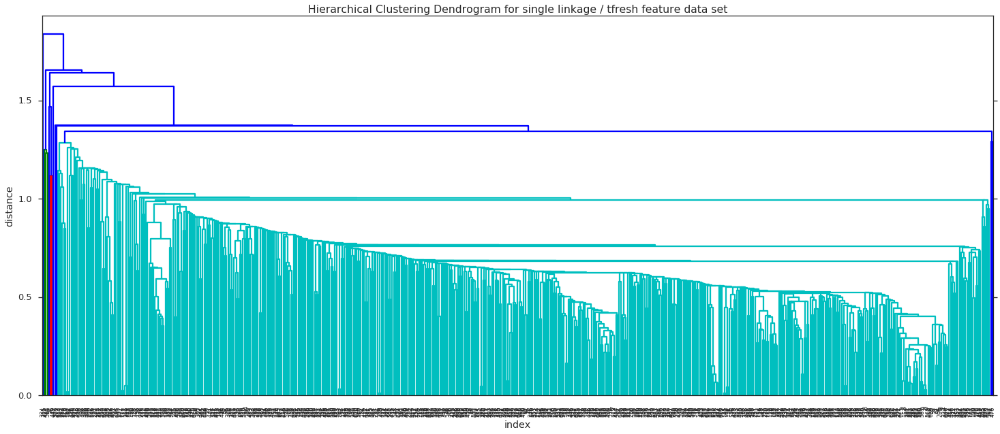

In [469]:
plot_dendogram(Z_single_f, 'single linkage / tfresh feature data set')

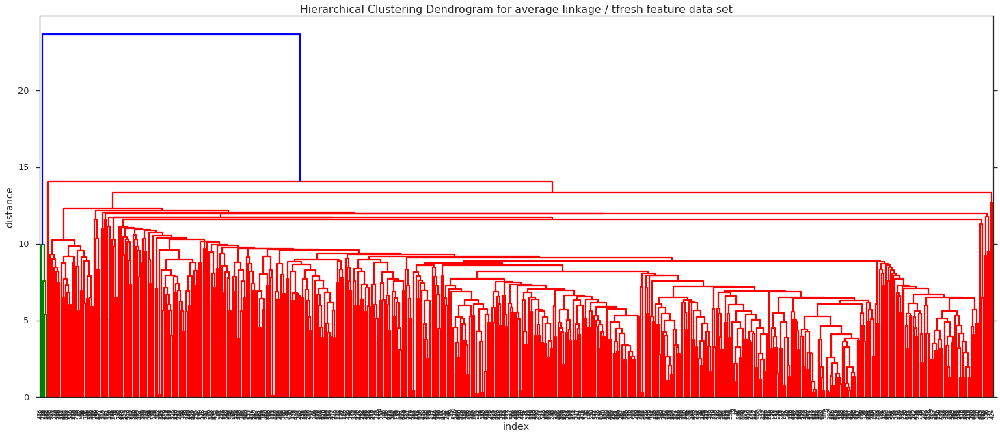

In [471]:
plot_dendogram(Z_average_f, 'average linkage / tfresh feature data set')

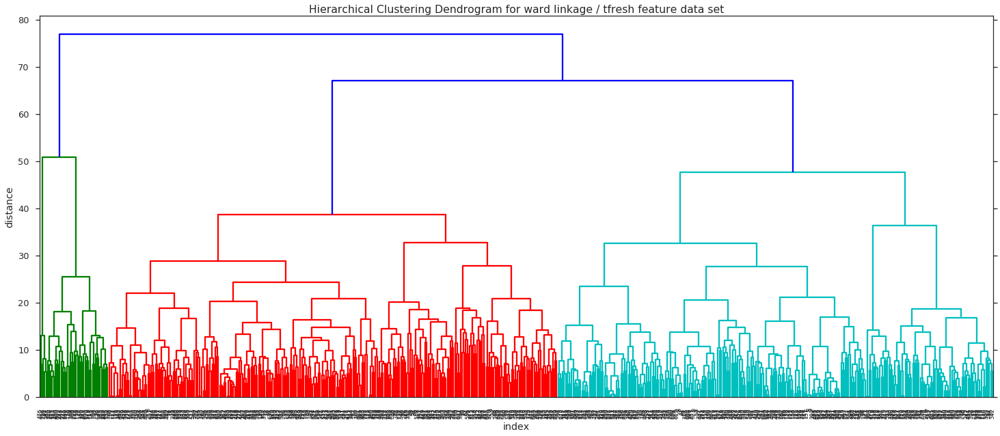

In [470]:
plot_dendogram(Z_ward_f, 'ward linkage / tfresh feature data set')

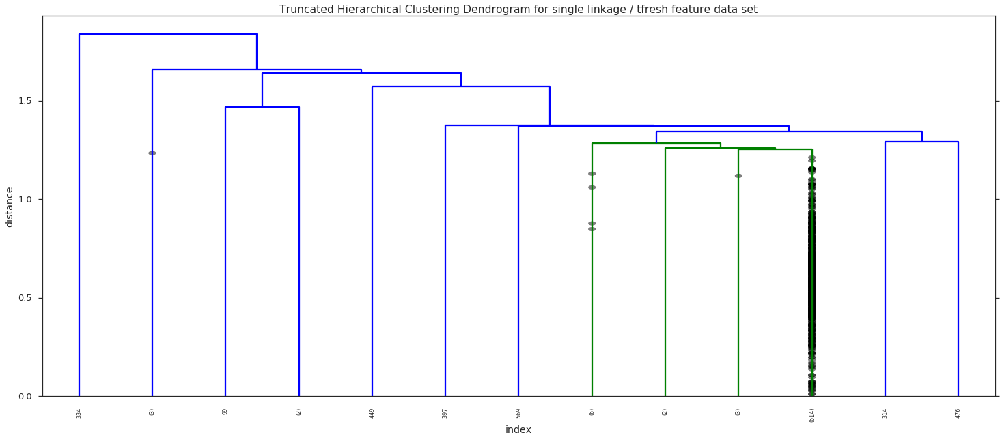

In [485]:
plot_truncated_dendogram(Z_single_f,'single linkage / tfresh feature data set',13)

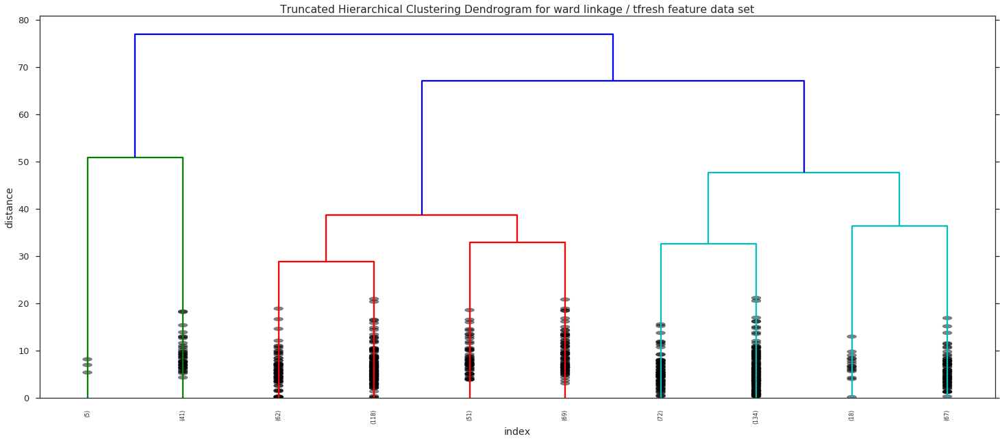

In [484]:
plot_truncated_dendogram(Z_ward_f,'ward linkage / tfresh feature data set',10)

### dendograms show that we also should use ward distance for hc cluster and our eyeball judgement choose k = 10 as the cut off line. 

### DBscan


In [472]:
for (eps,min_samples) in [(14,3),(1,2),(0.5,2),(0.5,3)]:
    dbscan_fit(eps,min_samples, transfromed_features)

When eps is 14, minimum data points is 3, estimated number of clusters: 1
No Silhouette score
When eps is 1, minimum data points is 2, estimated number of clusters: 23
Silhouette score -0.23001510049344945
When eps is 0.5, minimum data points is 2, estimated number of clusters: 15
Silhouette score -0.2513716570204212
When eps is 0.5, minimum data points is 3, estimated number of clusters: 2
Silhouette score -0.1816970459070155


In [473]:
# pick 1 and min points as 2 set
dbscan_clusters = dbscan_fit(0.5,2, transfromed_features)

When eps is 0.5, minimum data points is 2, estimated number of clusters: 15
Silhouette score -0.2513716570204212


### all sihouette scores we got for DBscan are on the negative side, it indicates that this clustering scheme tends to put data points of this data set in the wrong cluster. 

### birch clustering

In [580]:
birch_cluster([5,6,7,8,9,10,11,12,13,14,15],transfromed_features)

number of cluster: 5   Silhouette score: 0.0719997701047
number of cluster: 6   Silhouette score: 0.0708524375969
number of cluster: 7   Silhouette score: 0.0740226749681
number of cluster: 8   Silhouette score: 0.0790443957771
number of cluster: 9   Silhouette score: 0.0565906683087
number of cluster: 10   Silhouette score: 0.0621326331019
number of cluster: 11   Silhouette score: 0.0626028722568
number of cluster: 12   Silhouette score: 0.0556346366069
number of cluster: 13   Silhouette score: 0.054773245665
number of cluster: 14   Silhouette score: 0.0501925560008
number of cluster: 15   Silhouette score: 0.0443148592356


In [581]:
# from the test result of birch cluster, we pick cluster number 8 and we got silhouette score as 0.079
bc_labels_f = birch_cluster([8],transfromed_features, True)

number of cluster: 8   Silhouette score: 0.0790443957771


### affinity propagation clustering

In [582]:
ap_cluster([-1000, -800, -600, -400, -200],transfromed_features)

For preference = -1000 , estimated number of clusters: 6 Silhouette score 0.0746985527586
For preference = -800 , estimated number of clusters: 8 Silhouette score 0.0746106230753
For preference = -600 , estimated number of clusters: 10 Silhouette score 0.0771211667021
For preference = -400 , estimated number of clusters: 12 Silhouette score 0.0743193835587
For preference = -200 , estimated number of clusters: 24 Silhouette score 0.0610317453727


In [583]:
# from the test result of affinity propagation cluster, we pick params as -600, which gives number of cluster as 10 and we got silhouette score as 0.077
ap_labels_f = ap_cluster([-600],transfromed_features, True)

For preference = -600 , estimated number of clusters: 10 Silhouette score 0.0771211667021


### Problem 2c

[back to top](#top)

<a id="Problem-2c"></a>

Repeat the clustering assessment of your best feature-based clustering approach.

Silhouette Coefficient: -0.251372


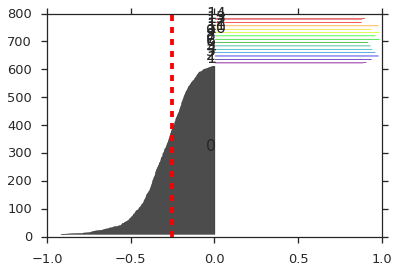

In [475]:
plot_silhouette(15,transfromed_features,dbscan_clusters+1)

Silhouette Coefficient: 0.075211
Silhouette Coefficient: 0.078151
Silhouette Coefficient: 0.082581
Silhouette Coefficient: 0.058025
Silhouette Coefficient: 0.052413
Silhouette Coefficient: 0.057687


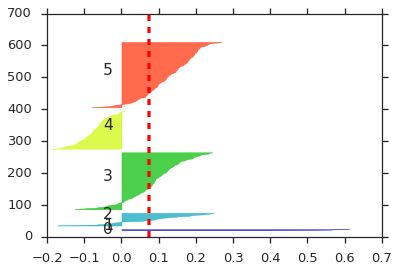

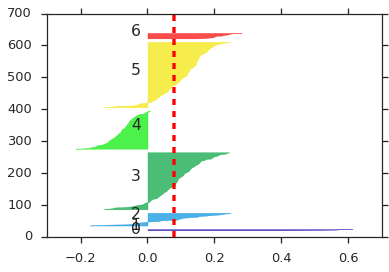

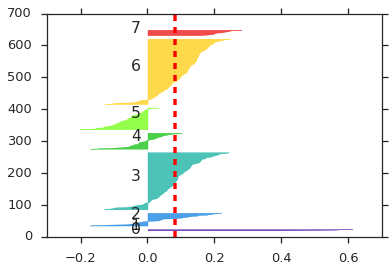

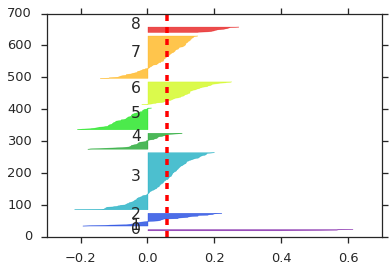

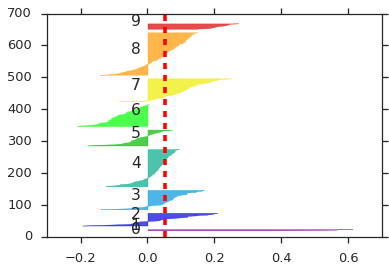

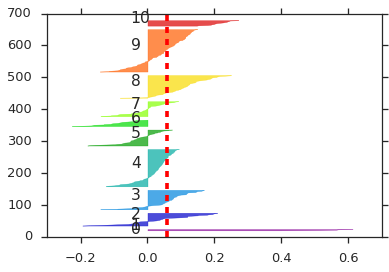

In [479]:
for k in [6, 7, 8, 9, 10, 11]:
    hc_clusters_on_feature= fcluster(Z_ward_f, k, criterion='maxclust')
    plot_silhouette(k,transfromed_features,hc_clusters_on_feature)

In [489]:
k = 8
hc_clusters_on_f = fcluster(Z_ward_f, k, criterion='maxclust')

### from the silhouette score we did for hc cluster, it suggests us to use K = 8 as the best K

8 clusters have silhouette score 0.09489798888792934
Silhouette Coefficient: 0.094898


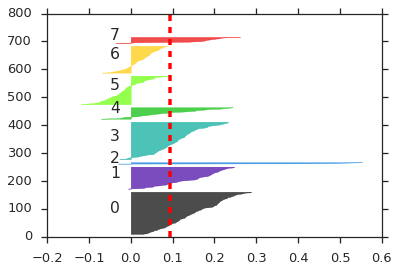

In [487]:
k = 8
km_f_clusters = calculate_sil_score_km(k, transfromed_features)
plot_silhouette(8,transfromed_features,km_f_clusters)

Silhouette Coefficient: 0.079044


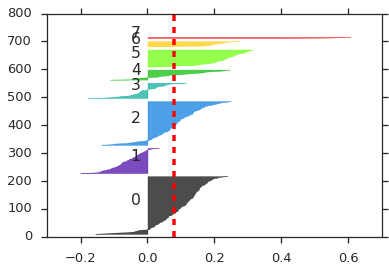

In [586]:
plot_silhouette(8,transfromed_features,bc_labels_f)

Silhouette Coefficient: 0.077121


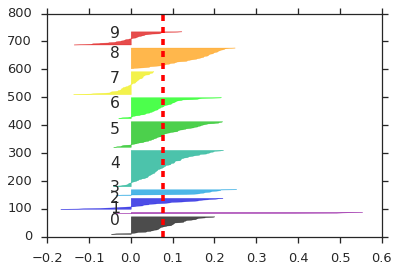

In [585]:
plot_silhouette(10,transfromed_features,ap_labels_f)

In [492]:
print(metrics.adjusted_rand_score(df_mutualFunds.type.values, dbscan_clusters))

-0.008866964416797704


In [584]:
print('Rand index between morningstar and kmeans is {}'.format(metrics.adjusted_rand_score(df_mutualFunds.type.values, km_f_clusters)))
print('Rand index between morningstar and hc is {}'.format(metrics.adjusted_rand_score(df_mutualFunds.type.values, hc_clusters_on_f)))
print('Rand index between morningstar and birch is {}'.format(metrics.adjusted_rand_score(df_mutualFunds.type.values, bc_labels_f)))
print('Rand index between morningstar and affinity Propagation is {}'.format(metrics.adjusted_rand_score(df_mutualFunds.type.values, ap_labels_f)))
print('Rand index between kmeans and hc is {}'.format(metrics.adjusted_rand_score(hc_clusters_on_f, km_f_clusters)))

Rand index between morningstar and kmeans is 0.20897613599188392
Rand index between morningstar and hc is 0.20891987938969772
Rand index between morningstar and birch is 0.20987167218879013
Rand index between morningstar and affinity Propagation is 0.17913798391494004
Rand index between kmeans and hc is 0.4900079140796613


### just solely depend on silhouette score and plot, we can see that DBscan gives quite poor clusters. we didn't try meanshift clustering in this case, since we know that it won't behave well here. HC cluster using ward distance and k = 8 gives us silhouette score as 0.083; while kmeans cluster using euclidean distance and k = 9 produces silhouette core as 0.094. affinity propagation k = 10 gives us silhouette score as 0.077; birch clustering k =8 gives us silhouette score as 0.079

### comparing with the morningstar categories, kmeans and hccluster almost give the same percentage overlapping with the official one, as well as birch. Affinity propagation is also not far off.  If we compare kmeans and hc cluster result, we saw that their matches almost got to 50%, which indicates based on feature set, these two clustering methods have the same performance.


### Problem 2d

[back to top](#top)

<a id="Problem-2d"></a>

Compare the clustering approach of the feature-based approach to the raw time-series approach.  Which would you use?  Justify the answer.  

Silhouette Coefficient: 0.221826


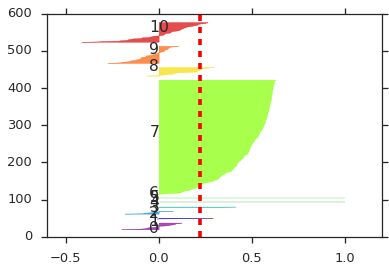

In [494]:
hc_clusters = fcluster(Z_ward_on_norm_data, 11, criterion='maxclust')
plot_silhouette(11, normalized_ts_shift_rm, hc_clusters)

In [496]:
print(metrics.adjusted_rand_score(df_mutualFunds.type.values, hc_clusters))

0.16513757800872275


13 clusters have silhouette score 0.20894117477918533
Silhouette Coefficient: 0.208941


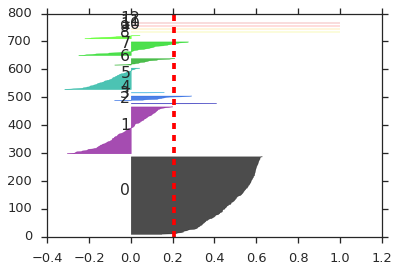

In [497]:
km_clusters = calculate_sil_score_km(13, normalized_ts_shift_rm)
plot_silhouette(13, normalized_ts_shift_rm, km_clusters)

In [498]:
print(metrics.adjusted_rand_score(df_mutualFunds.type.values, km_clusters))

0.2055412457795301


### visualize each cluster's mutual funds' time series and identify the quality of our clustering schemes

13 clusters have silhouette score 0.20894117477918533
[[  0 279]
 [  1 169]
 [  2   2]
 [  3  17]
 [  4   2]
 [  5  78]
 [  6  24]
 [  7  50]
 [  8  12]
 [  9   1]
 [ 10   1]
 [ 11   1]
 [ 12   1]]


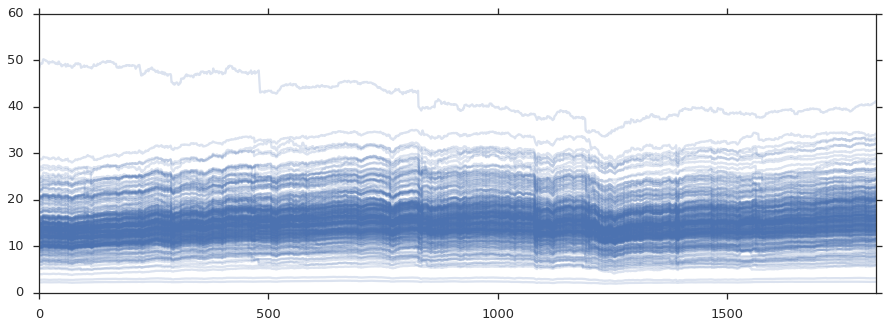

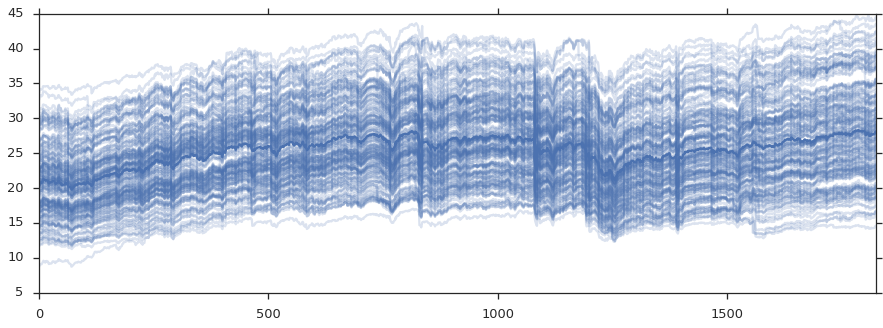

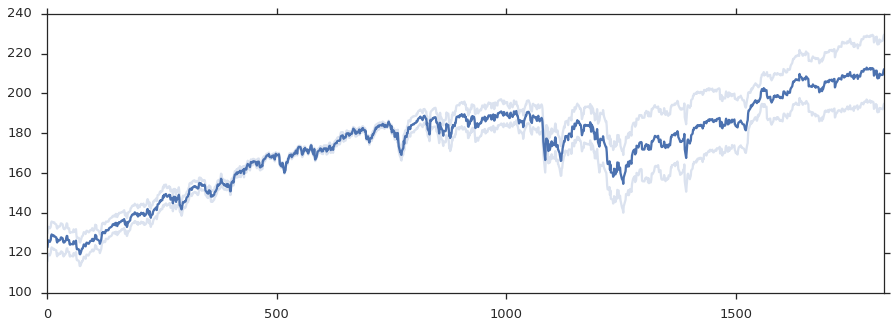

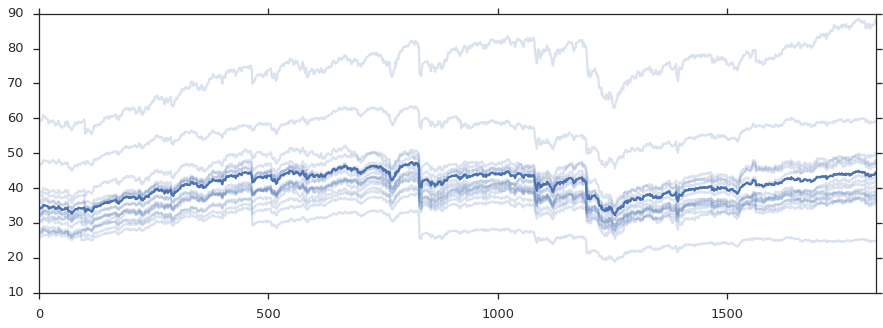

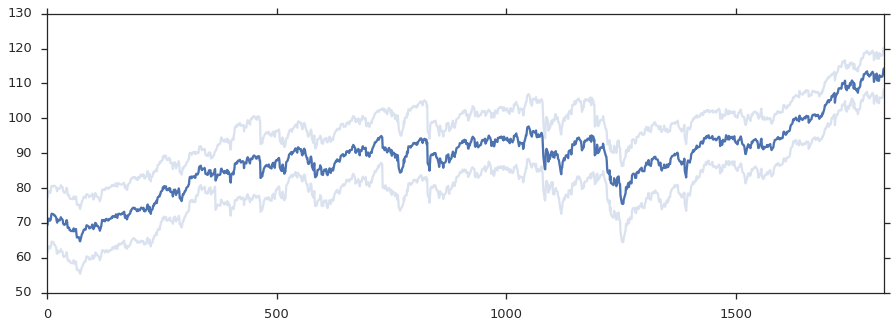

...

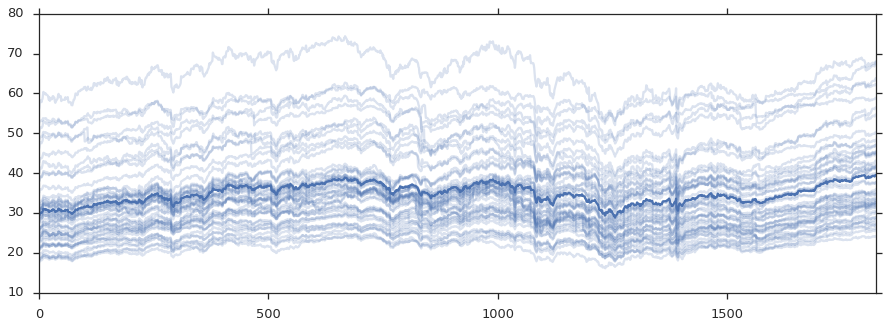

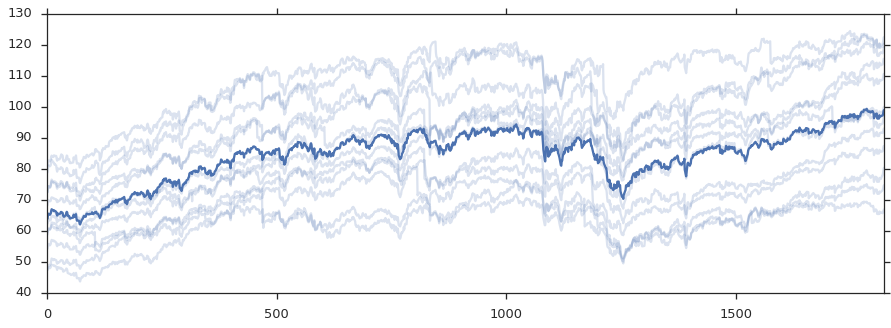

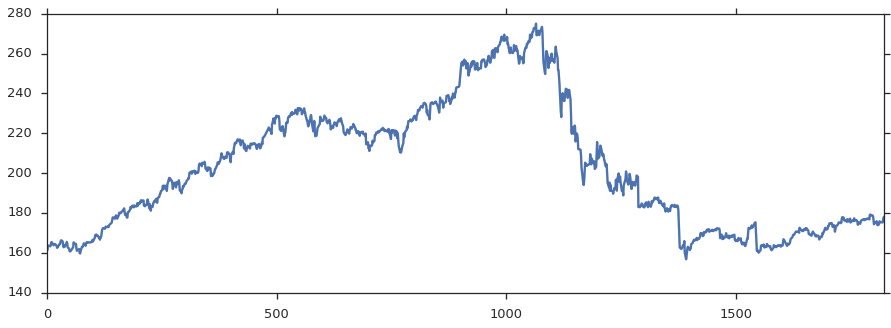

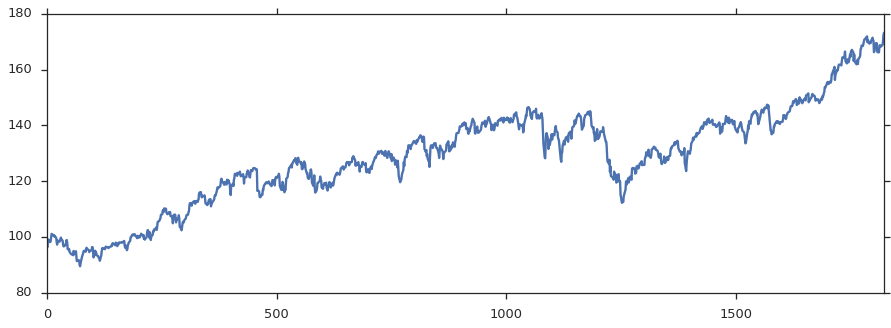

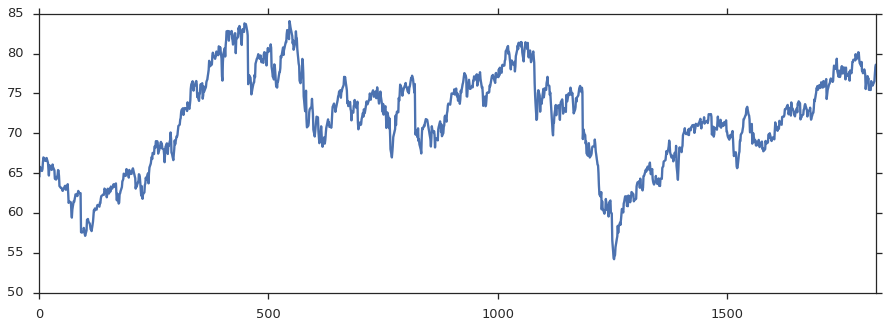

In [588]:
# kmean on raw data set
k = 13
km_clusters = calculate_sil_score_km(k, normalized_ts_shift_rm)
for i in range(k - 1):
    draw_cluster_timeseries_ds(km_clusters, i, timeseries_set, True)

[[  0  19]
 [  1   3]
 [  2   8]
 [  3   2]
 [  4   1]
 [  5   1]
 [  6 309]
 [  7  24]
 [  8  47]
 [  9  54]
 [ 10 169]]


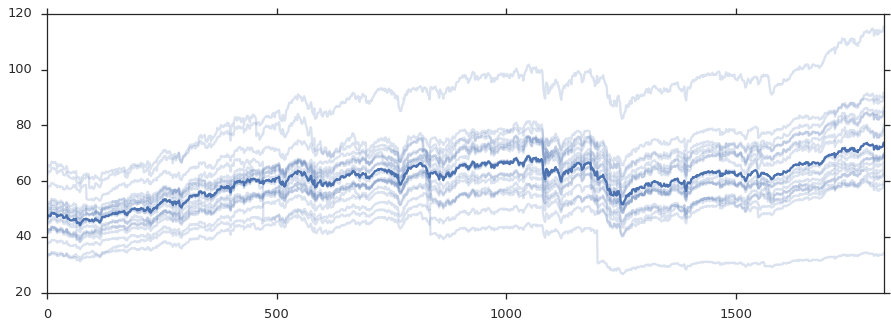

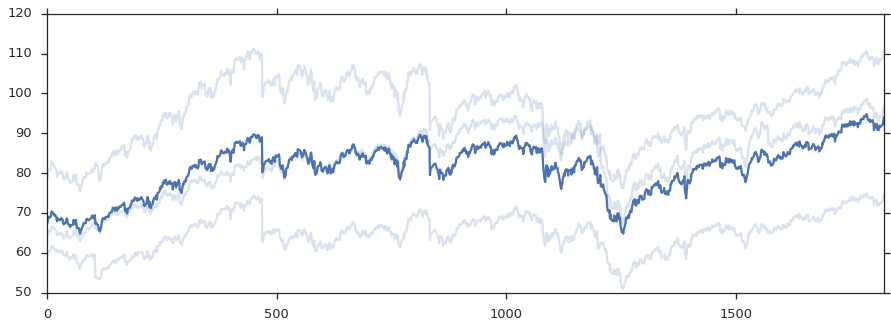

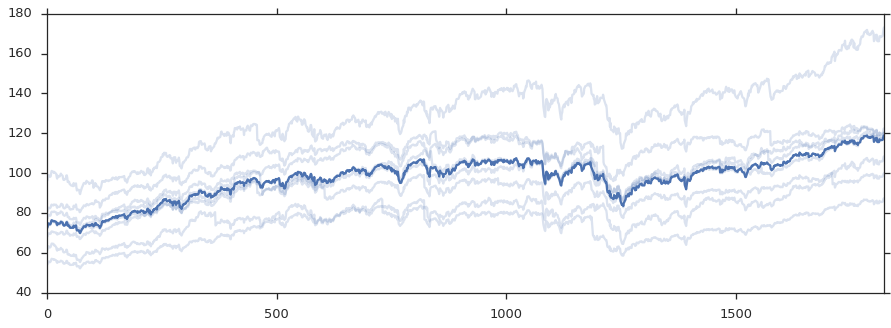

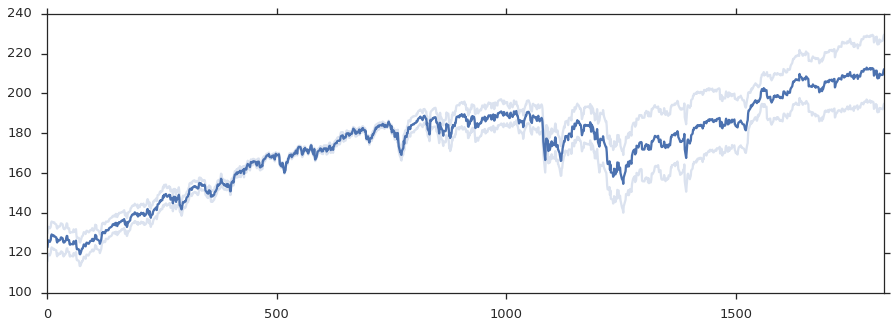

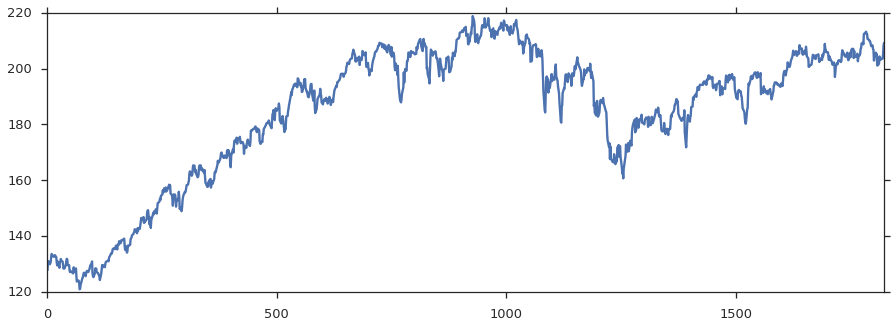

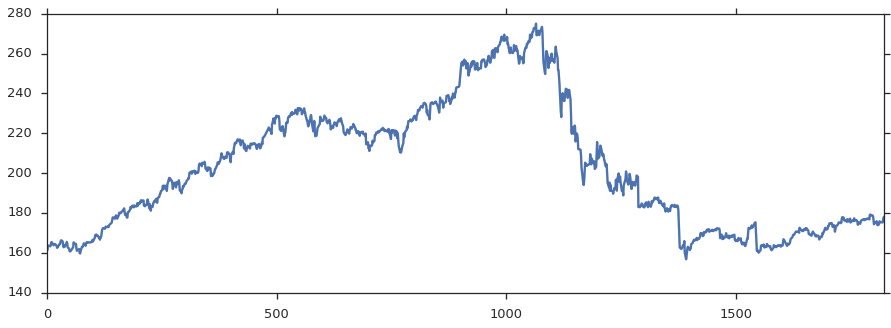

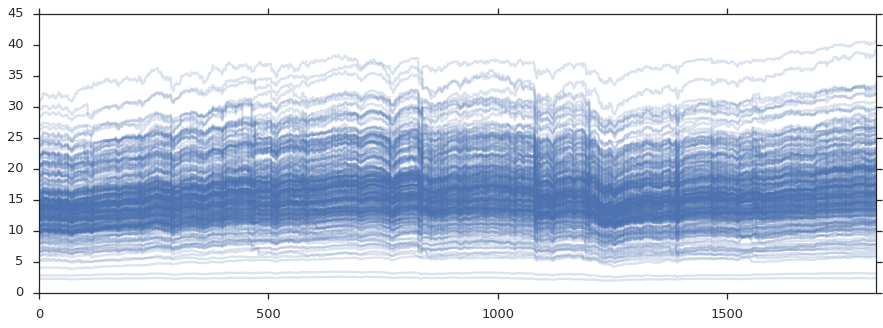

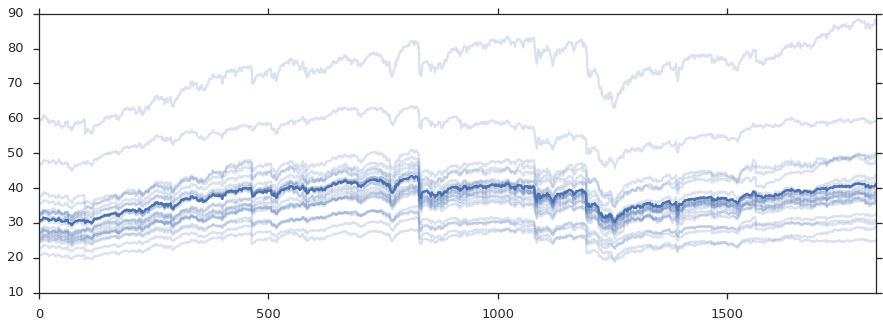

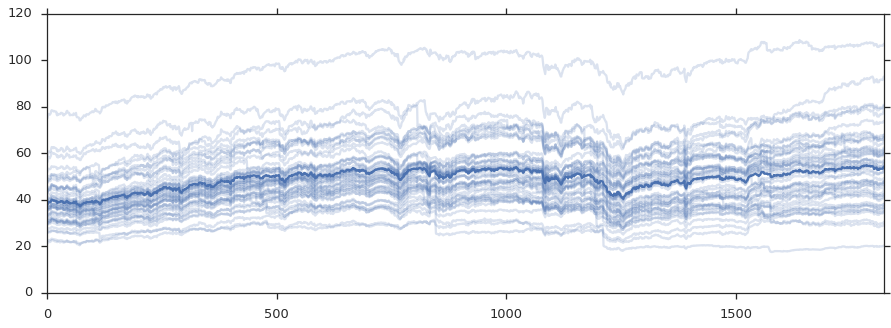

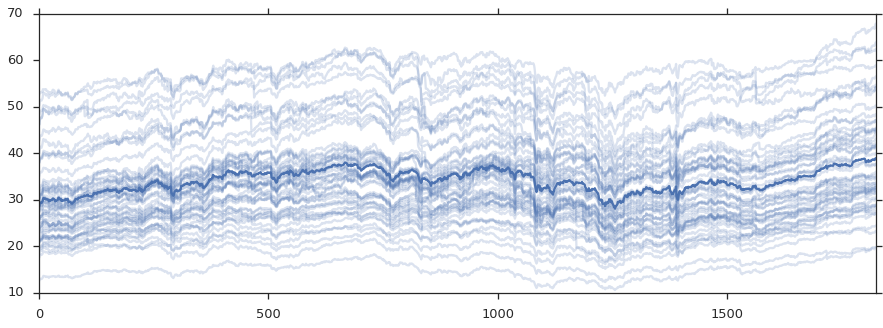

In [590]:
# hc on raw data set, which got the highest silhouette score in all clustering methods we used
k = 11
hc_clusters = fcluster(Z_ward_on_norm_data, k, criterion='maxclust')
for i in range(k - 1):
    draw_cluster_timeseries_ds(hc_clusters -1, i, timeseries_set, True)

9 clusters have silhouette score 0.07568985450065785
[[  0  23]
 [  1 105]
 [  2 149]
 [  3  77]
 [  4  68]
 [  5  82]
 [  6   5]
 [  7  28]
 [  8 100]]


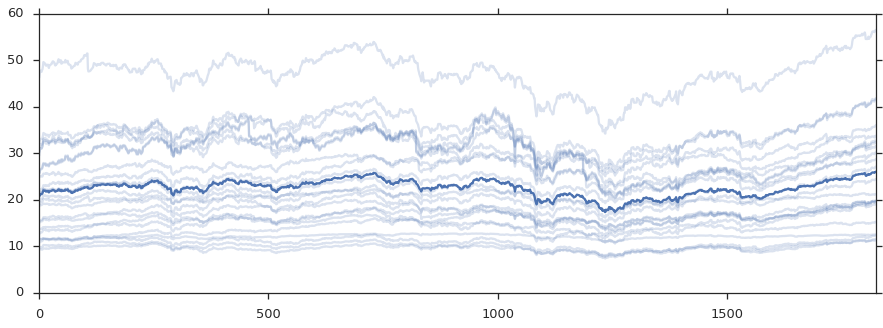

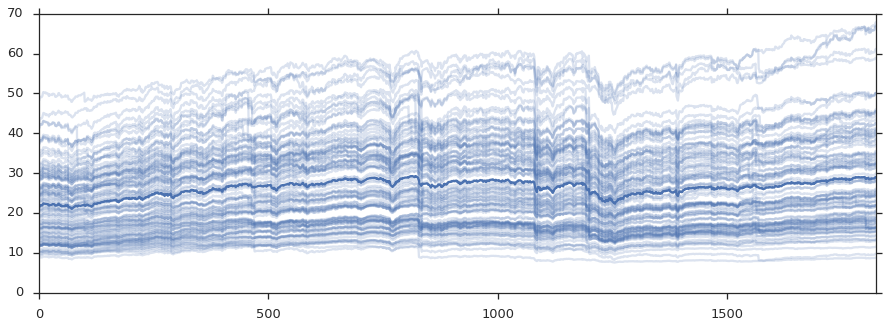

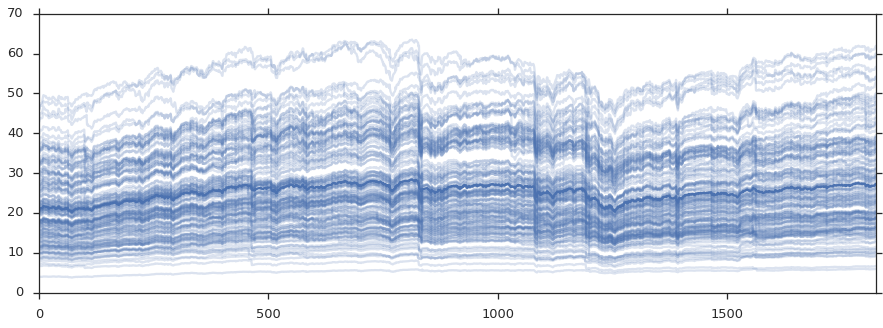

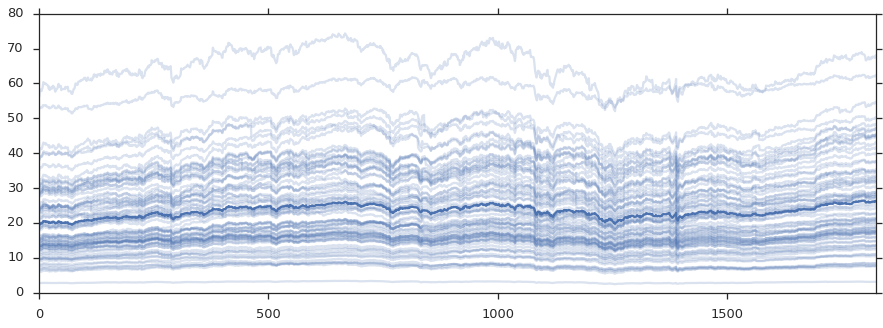

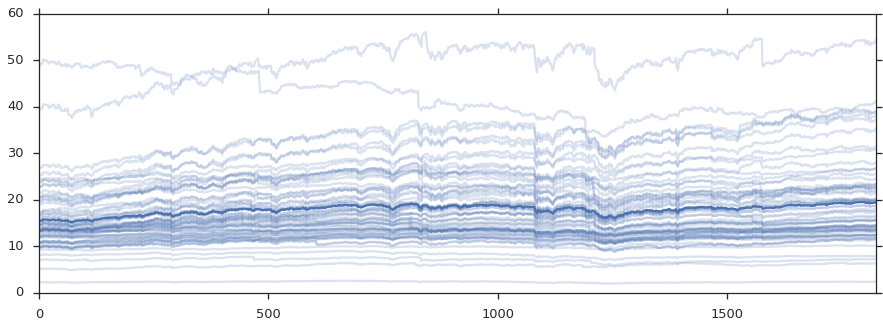

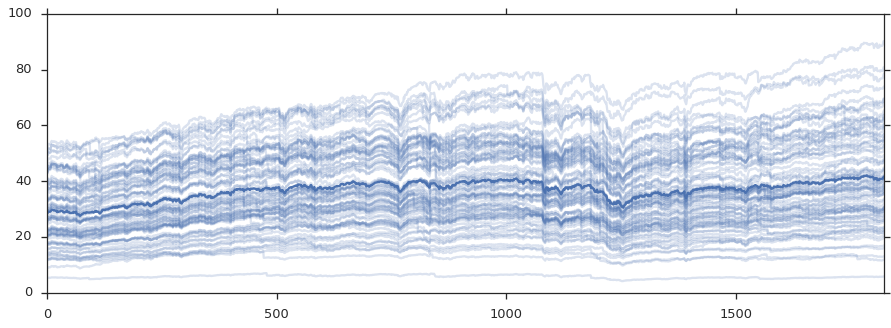

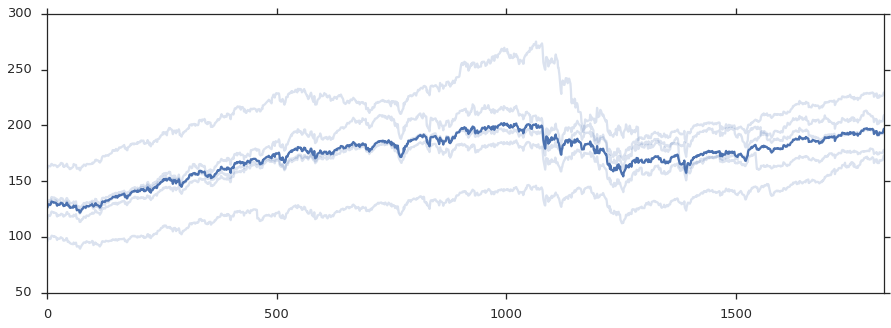

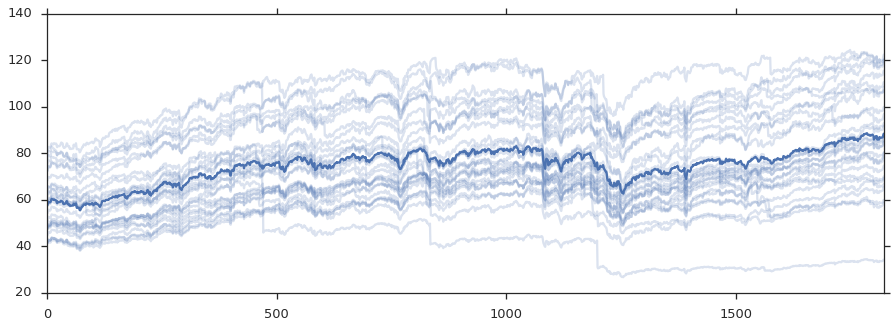

In [589]:
# kmeans on feature set
k = 9
km_f_clusters = calculate_sil_score_km(k, transfromed_features)
for i in range(k - 1):
    draw_cluster_timeseries_ds(km_f_clusters, i, timeseries_set, True)

### what we got from raw time-series approach are following:
- HC cluster ( ward distance, K= 11), silhouette score: 0.22 , rand index: 0.20
- Kmeans cluster ( K = 13) , silhouette score: 0.20 , rand index: 0.16
- DBscan cluster (eps as 0.5, min points as 2, silhouette score: -0.39, rand index: -0.02
- meanshift cluster k = 2, silhouette score: 0.75
- affinity propagation k = 11 , silhouette score: 0.2, rand index: 0.13
- birch clustering k = 7, silhouette score: 0.2, rand index: 0.18

### what we got from feature approach are following:
- HC cluster ( ward distance, K= 8), silhouette score: 0.083, rand index: 0.21
- Kmeans cluster ( K = 9) , silhouette score: 0.094, rand index: 0.21
- DBscan cluster (eps as 1, min points as 2, silhouette score: -0.25, rand index: -0.02
- affinity propagation k = 10 , silhouette score: 0.077, rand index: 0.20
- birch clustering k = 8, silhouette score: 0.079, rand index: 0.18


### from the comparison we can see that generally raw time-series cluster schemes provide higher silhouette score. The comparison with the morningstar result suggests there is no big difference between using raw time-series and using feature set, since the rand index are very close. However, if we look into the silhouette plot, obviously, using raw time-series, our clustering methods tends to include a huge number of mutual funds into one cluster, while, feature approach seems better at distingishing more patterns from the mutual fund dataset and cluster them accordingly. We also draw the time series by clusters for both kmeans, hc at raw time-series and kmeans at feature set. By looking into each clusteres, we can see that the clusters from the feature set have more consistency. clusters with raw data set has some outlier singled out, however, potentially, it might have similar pattern with certain funds.  It seems more reasonable to go with feature approach's result.